# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [1]:
!pip install kaggle

In [2]:
!pwd


/Users/nidhisaduvala/Desktop/Spring/AML/HCDR_Project/Group09_Phase2


In [3]:
!mkdir ~/.kaggle
!cp /root/shared/Downloads/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

mkdir: /Users/nidhisaduvala/.kaggle: File exists
cp: /root/shared/Downloads/kaggle.json: No such file or directory
chmod: /Users/nidhisaduvala/.kaggle/kaggle.json: No such file or directory


In [4]:
! kaggle competitions files home-credit-default-risk

Traceback (most recent call last):
  File "/Users/nidhisaduvala/opt/anaconda3/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/Users/nidhisaduvala/opt/anaconda3/lib/python3.8/site-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/Users/nidhisaduvala/opt/anaconda3/lib/python3.8/site-packages/kaggle/api/kaggle_api_extended.py", line 164, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /Users/nidhisaduvala/.kaggle. Or use the environment method.


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [5]:
# ![alt](home_credit.png "Home credit")

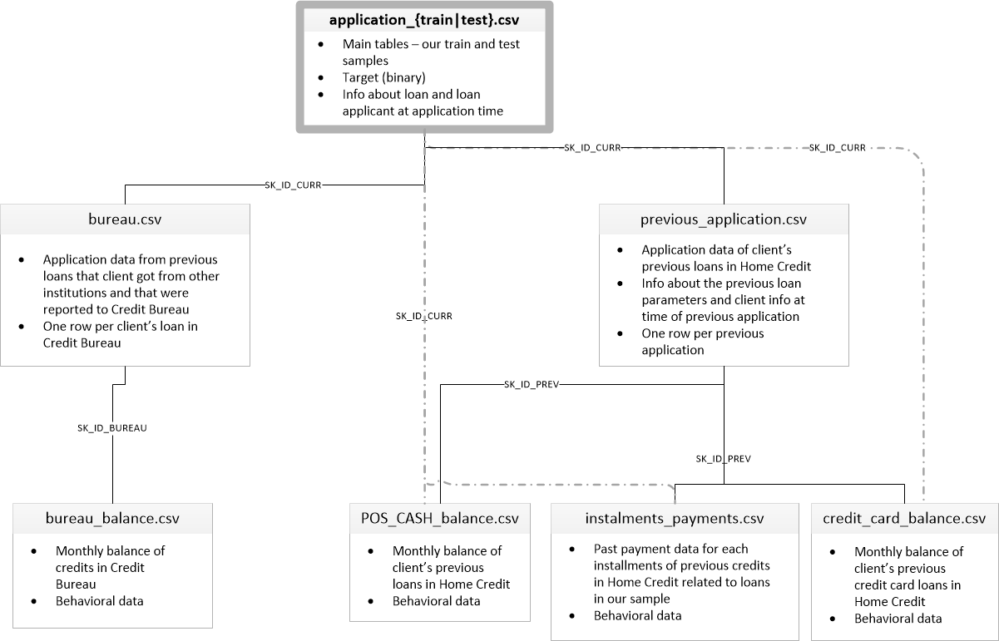

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [6]:
DATA_DIR = "/Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir $DATA_DIR

mkdir: /Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk: File exists


In [7]:
!ls -l $DATA_DIR

total 5245040
-rw-rw-r--@ 1 nidhisaduvala  staff      37383 Dec 11  2019 HomeCredit_columns_description.csv
-rw-r--r--@ 1 nidhisaduvala  staff    1183201 Apr 12 17:09 Kaggle_submission.png
-rw-rw-r--@ 1 nidhisaduvala  staff  392703158 Dec 11  2019 POS_CASH_balance.csv
-rw-rw-r--@ 1 nidhisaduvala  staff   26567651 Dec 11  2019 application_test.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  166133370 Dec 11  2019 application_train.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  170016717 Dec 11  2019 bureau.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  375592889 Dec 11  2019 bureau_balance.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  424582605 Dec 11  2019 credit_card_balance.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  723118349 Dec 11  2019 installments_payments.csv
-rw-rw-r--@ 1 nidhisaduvala  staff  404973293 Dec 11  2019 previous_application.csv
-rw-rw-r--@ 1 nidhisaduvala  staff     536202 Dec 11  2019 sample_submission.csv


In [8]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR

Traceback (most recent call last):
  File "/Users/nidhisaduvala/opt/anaconda3/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/Users/nidhisaduvala/opt/anaconda3/lib/python3.8/site-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/Users/nidhisaduvala/opt/anaconda3/lib/python3.8/site-packages/kaggle/api/kaggle_api_extended.py", line 164, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /Users/nidhisaduvala/.kaggle. Or use the environment method.


### Imports

In [9]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

In [10]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

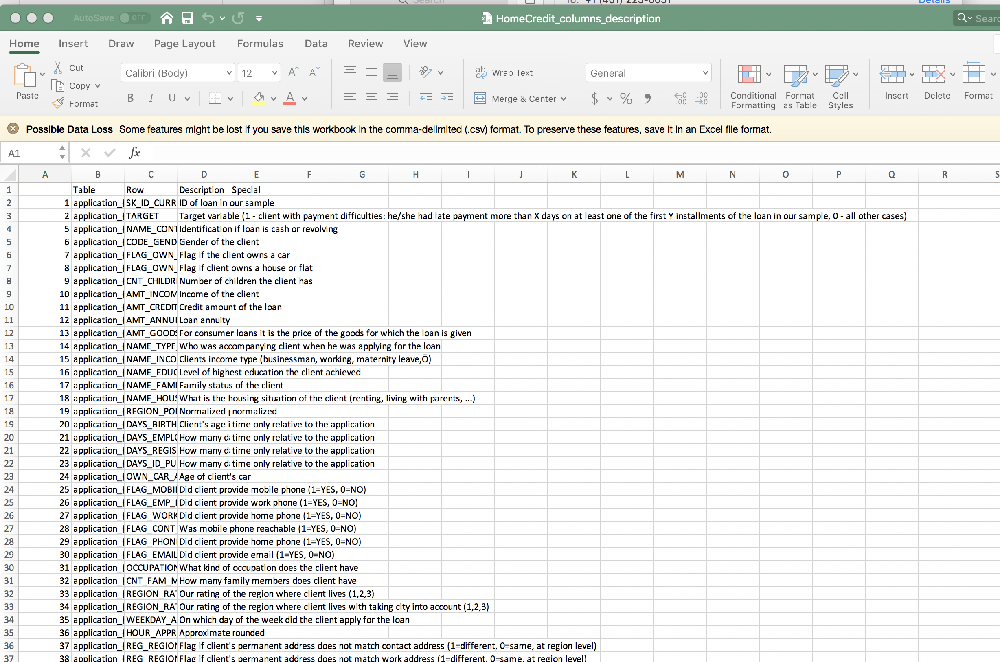

### Application train

In [11]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [12]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [13]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 23.1 s, sys: 3.52 s, total: 26.6 s
Wall time: 31.9 s


In [14]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


## Exploratory Data Analysis Phase -1

#### Descriptive statistics

● A data dictionary of the raw features. <br>
●  Pandas profiling in jupyter notebook. <br>
● We did descriptive analysis on the dataset such as data type of each feature, dataset size (rows and columns = 307511, 122), and summary statistics such as the number of observations, mean, standard deviation, maximum, minimum, and quartiles for all features and split of data is as follows Train: 70%, Test 20%, Validation 10%. <br>
● We generated charts on descriptive statistics of the target dataset. <br>

## Summary of Application train

In [15]:
application_test = pd.read_csv('/Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk/application_test.csv')
application_train = pd.read_csv('/Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk/application_train.csv')

In [16]:
def EDA(df,df_name):
    print("Test description; data type: {}".format(df_name))
    print(df.dtypes)
    print("\n##########################################################\n")
    print(" Dataset size (rows columns): {}".format(df_name))
    print(df.shape)
    print("\n##########################################################\n")
    print("Summary statistics: {}".format(df_name))
    print(df.describe())
    print("\n##########################################################\n")
    print("Correlation analysis: {}".format(df_name))
    print(df.corr())
    print("\n##########################################################\n")
    print("Other Analysis: {}".format(df_name))
    print("1. Checking for Null values: {}".format(df_name))
    print(df.isna().sum())
    print("\n2. Info")
    print(df.info())

In [17]:
EDA(datasets['application_train'],'application_train')

Test description; data type: application_train
SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

##########################################################

 Dataset size (rows columns): application_train
(307511, 122)

##########################################################

Summary statistics: application_train
          SK_ID_CURR         TARGET   CNT_CHILDREN  AMT_INCOME_TOTAL  \
count  307511.000000  307511.000000  307511.000000      3.075110e+05   
mean   278180.518577       0.080729       0.417052      1.687979e+05   
std    102790.175348       0.272419       0.722121      2.371231e+05  

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

2. Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


In [18]:
datasets["application_train"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [19]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [20]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [21]:
#datasets["application_train"].describe(include='all') #look at all categorical and numerical

## Missing data for application train

In [22]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


In [23]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


## Distribution of the target column 

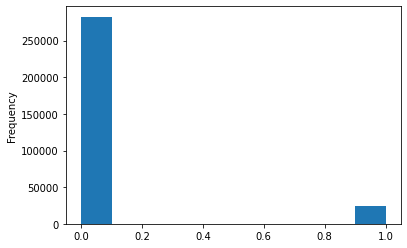

In [24]:
datasets["application_train"]['TARGET'].astype(int).plot.hist();

## Correlation with  the target column 

In [25]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


## Applicants Age 

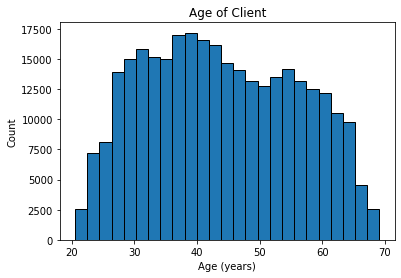

In [26]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

## Applicants occupations

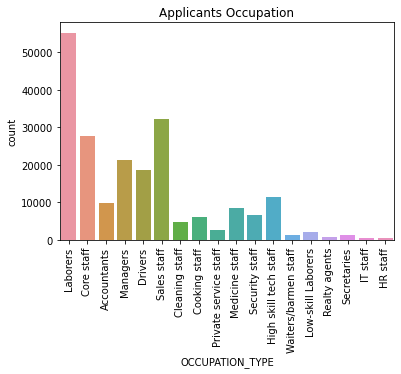

In [27]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

##  Target Vs borrowers based on gender

In [28]:
male_data = application_train[application_train['CODE_GENDER']=='M']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
male_data['count_percent'] = male_data['user_count']/male_data['user_count'].sum()*100
male_data['CODE_GENDER'] = 'M'
female_data = application_train[application_train['CODE_GENDER']=='F']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
female_data['count_percent'] = female_data['user_count']/female_data['user_count'].sum()*100
female_data['CODE_GENDER'] = 'F'
gender_data = male_data.append(female_data, ignore_index=True,sort=False)
gender_data

,TARGET,user_count,count_percent,CODE_GENDER
0,0,94404,89.858080,M
1,1,10655,10.141920,M
2,0,188278,93.000672,F
3,1,14170,6.999328,F


Text(10.772152777777777, 0.5, 'User count in Percentage')

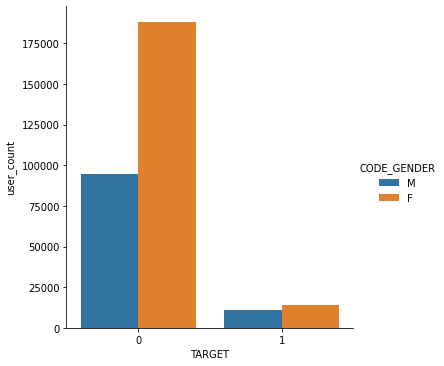

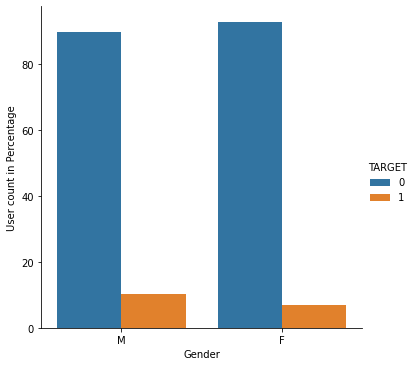

In [29]:
sns.catplot(data=gender_data, kind="bar", x="TARGET", y="user_count", hue="CODE_GENDER")
sns.catplot(data=gender_data, kind="bar", x="CODE_GENDER", y="count_percent", hue="TARGET")
plt.xlabel("Gender")
plt.ylabel('User count in Percentage')

### Male most likely to default than Female based on percentage of defaulter_count(Second Graph)


## Gender Vs Income based on Target

Text(0, 0.5, 'Annual Income')

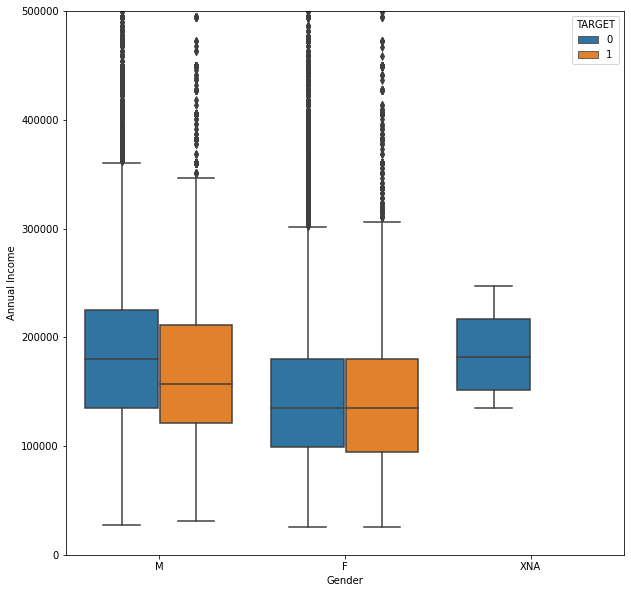

In [30]:
fig,ax = plt.subplots(figsize = (10,10))
sns.boxplot(x='CODE_GENDER',hue = 'TARGET',y='AMT_INCOME_TOTAL', data=application_train)
plt.ylim(0, 500000)
plt.xlabel("Gender")
plt.ylabel('Annual Income')


## Own House count based Target


In [31]:
own_house_data = application_train[application_train['FLAG_OWN_REALTY']=='Y']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
own_house_data['OWN_HOUSE'] = 'Y'
own_house_data['count_percent'] = own_house_data['user_count']/own_house_data['user_count'].sum()*100
not_own_house_data = application_train[application_train['FLAG_OWN_REALTY']=='N']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
not_own_house_data['OWN_HOUSE'] = 'N'
not_own_house_data['count_percent'] = not_own_house_data['user_count']/not_own_house_data['user_count'].sum()*100
own_house_data = own_house_data.append(not_own_house_data,ignore_index=True,sort=False)
own_house_data


,TARGET,user_count,OWN_HOUSE,count_percent
0,0,196329,Y,92.038423
1,1,16983,Y,7.961577
2,0,86357,N,91.675071
3,1,7842,N,8.324929


Text(10.772152777777777, 0.5, 'User count in Percentage')

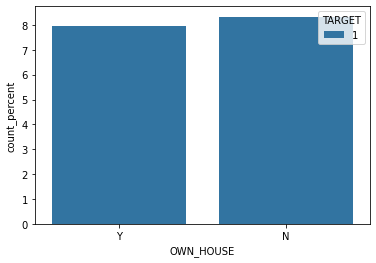

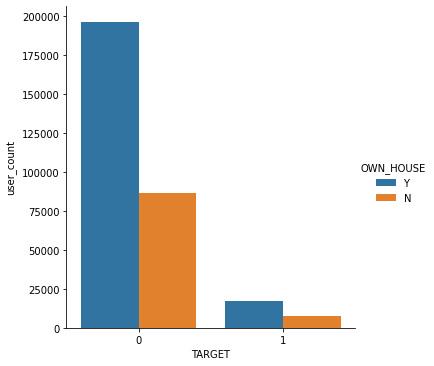

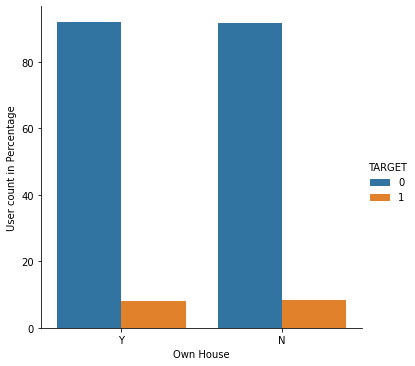

In [32]:
sns.barplot(x='OWN_HOUSE',y='count_percent',hue = 'TARGET',data=own_house_data[own_house_data['TARGET']==1])

sns.catplot(data=own_house_data, kind="bar", x="TARGET", y="user_count", hue="OWN_HOUSE")

sns.catplot(data=own_house_data, kind="bar", x="OWN_HOUSE", y="count_percent", hue="TARGET")
plt.xlabel("Own House")
plt.ylabel('User count in Percentage')


### Not a significant difference, but borrowers who own a house are more likely to pay 

## Own car count based Target

In [33]:
own_car_data = application_train[application_train['FLAG_OWN_CAR']=='Y']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
own_car_data['FLAG_OWN_CAR'] = 'Y'
own_car_data['count_percent'] = own_car_data['user_count']/own_car_data['user_count'].sum()*100
not_own_car_data = application_train[application_train['FLAG_OWN_CAR']=='N']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
not_own_car_data['FLAG_OWN_CAR'] = 'N'
not_own_car_data['count_percent'] = not_own_car_data['user_count']/not_own_car_data['user_count'].sum()*100
own_car_data = own_car_data.append(not_own_car_data,ignore_index=True,sort=False)
own_car_data

,TARGET,user_count,FLAG_OWN_CAR,count_percent
0,0,97011,Y,92.756270
1,1,7576,Y,7.243730
2,0,185675,N,91.499773
3,1,17249,N,8.500227


Text(10.772152777777777, 0.5, 'User count in Percentage')

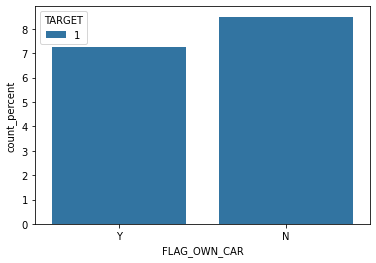

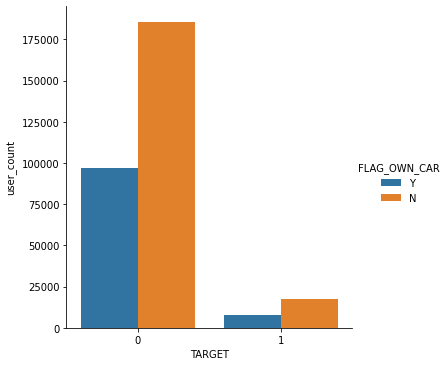

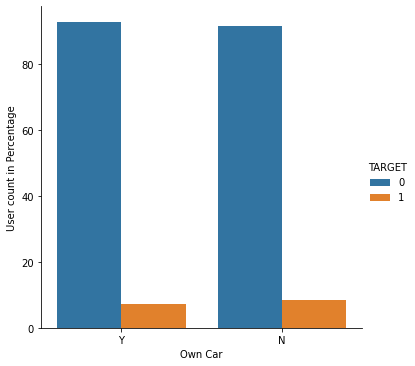

In [34]:
sns.barplot(x='FLAG_OWN_CAR',y='count_percent',hue = 'TARGET',data=own_car_data[own_car_data['TARGET']==1])

sns.catplot(data=own_car_data, kind="bar", x="TARGET", y="user_count", hue="FLAG_OWN_CAR")

sns.catplot(data=own_car_data, kind="bar", x="FLAG_OWN_CAR", y="count_percent", hue="TARGET")
plt.xlabel("Own Car")
plt.ylabel('User count in Percentage')

### Borrowers owning a car are more likely to pay on time

## Occupation type count based on Target


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Laborers'),
  Text(1, 0, 'Core staff'),
  Text(2, 0, 'Accountants'),
  Text(3, 0, 'Managers'),
  Text(4, 0, 'Drivers'),
  Text(5, 0, 'Sales staff'),
  Text(6, 0, 'Cleaning staff'),
  Text(7, 0, 'Cooking staff'),
  Text(8, 0, 'Private service staff'),
  Text(9, 0, 'Medicine staff'),
  Text(10, 0, 'Security staff'),
  Text(11, 0, 'High skill tech staff'),
  Text(12, 0, 'Waiters/barmen staff'),
  Text(13, 0, 'Low-skill Laborers'),
  Text(14, 0, 'Realty agents'),
  Text(15, 0, 'Secretaries'),
  Text(16, 0, 'IT staff'),
  Text(17, 0, 'HR staff')])

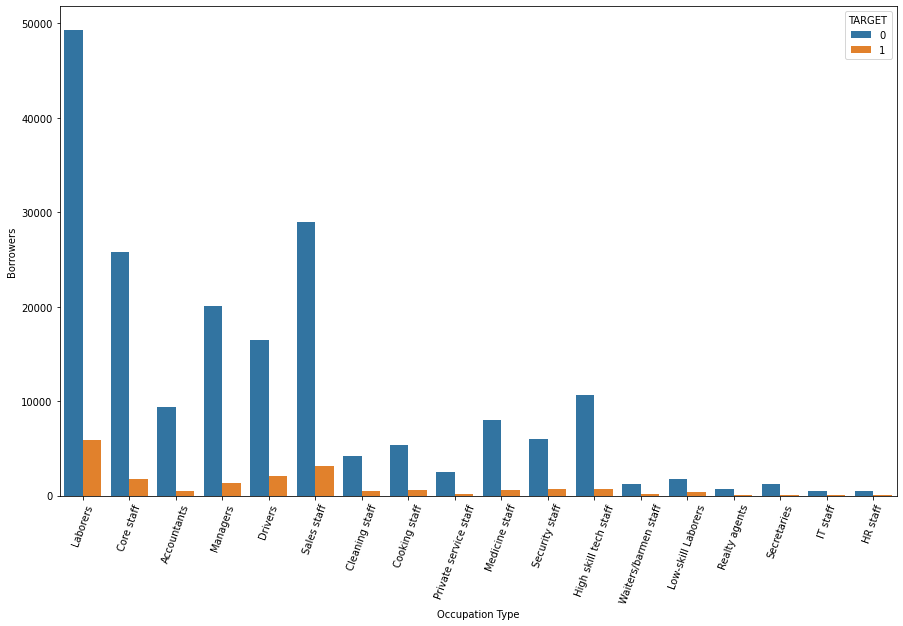

In [35]:
fig, ax = plt.subplots(figsize=(15,9))
sns.countplot(x='OCCUPATION_TYPE', hue = 'TARGET',data=application_train)
plt.xlabel("Occupation Type")
plt.ylabel('Borrowers')
plt.xticks(rotation=70)

## Occupation type vs income based on Target

Text(0, 0.5, 'Average Annual family income')

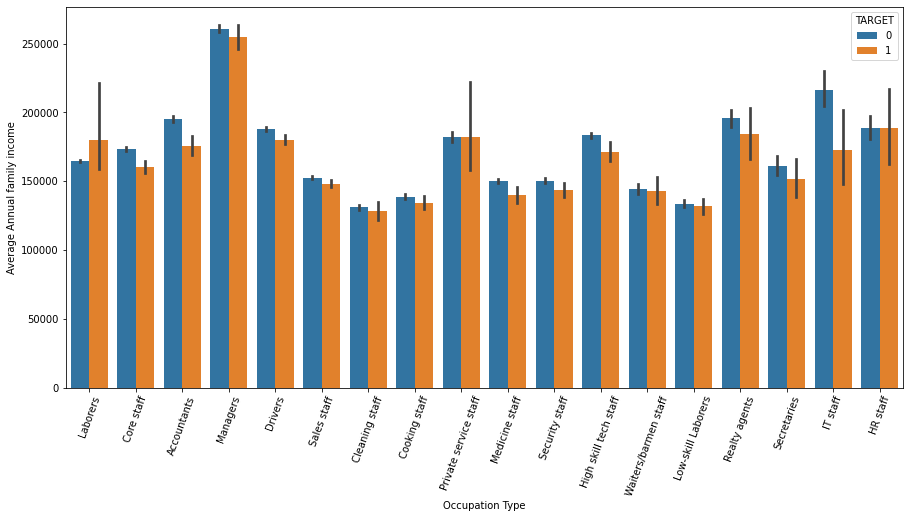

In [36]:
fig, ax = plt.subplots(figsize=(15,7))
sns.barplot(x='OCCUPATION_TYPE',y='AMT_INCOME_TOTAL',hue = 'TARGET',data=application_train)
plt.xticks(rotation=70)
plt.xlabel("Occupation Type")
plt.ylabel("Average Annual family income")


In [37]:
income_credit_ratio_data = application_train[['AMT_INCOME_TOTAL','AMT_CREDIT','TARGET']]
income_credit_ratio_data['IC_ratio'] = income_credit_ratio_data['AMT_INCOME_TOTAL']/income_credit_ratio_data['AMT_CREDIT']
income_credit_ratio_data['quantile'] = pd.qcut(income_credit_ratio_data['IC_ratio'],q = 10, labels = False)
income_credit_ratio_data

,AMT_INCOME_TOTAL,AMT_CREDIT,TARGET,IC_ratio,quantile
0,202500.0,406597.5,1,0.498036,7
1,270000.0,1293502.5,0,0.208736,2
2,67500.0,135000.0,0,0.500000,7
3,135000.0,312682.5,0,0.431748,6
4,121500.0,513000.0,0,0.236842,3
...,...,...,...,...,...
307506,157500.0,254700.0,0,0.618375,8
307507,72000.0,269550.0,0,0.267112,4
307508,153000.0,677664.0,0,0.225776,3
307509,171000.0,370107.0,1,0.462029,7


In [38]:
income_credit_ratio_data = income_credit_ratio_data.groupby(['quantile','TARGET'])['AMT_INCOME_TOTAL'].count().reset_index().rename(columns={'AMT_INCOME_TOTAL':'user_count'})
income_credit_ratio_data['count_percent'] = income_credit_ratio_data.apply(lambda x: x['user_count']/income_credit_ratio_data[income_credit_ratio_data['quantile']==x['quantile']]['user_count'].sum()*100,axis=1)
income_credit_ratio_data

,quantile,TARGET,user_count,count_percent
0,0,0,28613,92.929523
1,0,1,2177,7.070477
2,1,0,28499,92.577313
3,1,1,2285,7.422687
4,2,0,28241,92.035196
5,2,1,2444,7.964804
6,3,0,28128,91.375110
7,3,1,2655,8.624890
8,4,0,27899,90.805234
9,4,1,2825,9.194766


Text(0, 0.5, 'defaulter/Non-defaulter percentage')

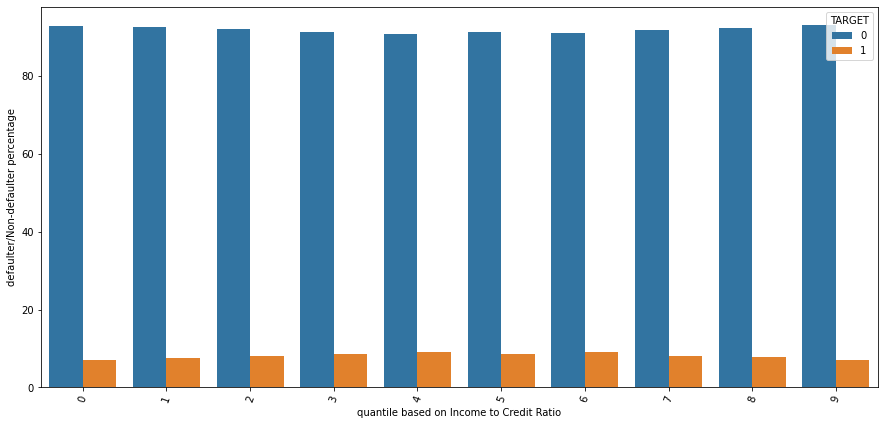

In [39]:
fig, ax = plt.subplots(figsize=(15,7))
sns.barplot(x='quantile',y='count_percent',hue = 'TARGET',data=income_credit_ratio_data)
plt.xticks(rotation=70)
plt.xlabel("quantile based on Income to Credit Ratio")
plt.ylabel("defaulter/Non-defaulter percentage")

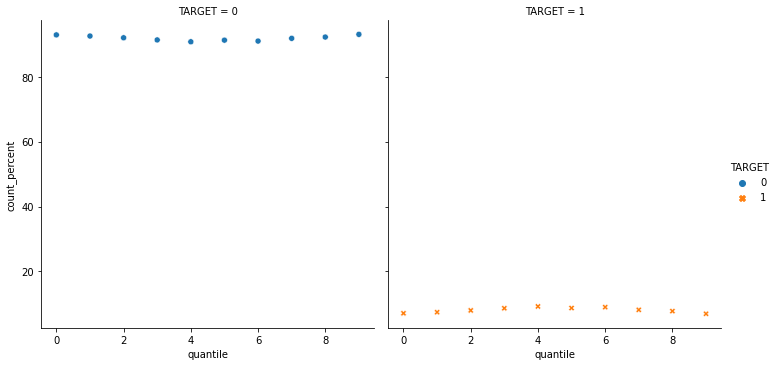

In [40]:
sns.relplot(
    data=income_credit_ratio_data, x="quantile", y="count_percent",
    col="TARGET", hue="TARGET", style="TARGET",
    kind="scatter"
)

### Defaulters percentage is less when IC_ratio is either Low or High

## Repayers to Applicants Ratio

In [41]:
occ_data = pd.DataFrame(data=application_train.groupby(['OCCUPATION_TYPE','TARGET']).count()['SK_ID_CURR'])
occ_data = occ_data.reset_index() 
value_counts = occ_data['SK_ID_CURR'].values
def repayers_to_applicants_ratio(values):
    flag = 1
    ratios = []
    for count in range(len(values)):
        if flag == 1:
            current_number = values[count]
            next_number = values[count+1]
            ratios.append(current_number/(current_number+next_number))
            ratios.append(current_number/(current_number+next_number))
        flag=flag*-1
    return ratios
occ_data['Ratio R/A'] = repayers_to_applicants_ratio(value_counts)
occ_ratio = occ_data.groupby(['OCCUPATION_TYPE','Ratio R/A']).count().drop(['TARGET', 'SK_ID_CURR'],axis=1)
occ_ratio = occ_ratio.reset_index() 
occ_ratio = occ_ratio.sort_values(['Ratio R/A'],ascending=False)
occ_ratio

,OCCUPATION_TYPE,Ratio R/A
0,Accountants,0.951697
6,High skill tech staff,0.938401
10,Managers,0.937860
3,Core staff,0.936960
5,HR staff,0.936057
7,IT staff,0.935361
12,Private service staff,0.934012
11,Medicine staff,0.932998
15,Secretaries,0.929502
13,Realty agents,0.921438


## Correlation of the positive days since birth and target

In [42]:
# Find the correlation of the positive days since birth and target
application_train['DAYS_BIRTH'] = abs(application_train['DAYS_BIRTH'])
-1*(application_train['DAYS_BIRTH'].corr(application_train['TARGET']))

0.07823930830982737

## Correlation of the positive days since employement and target

In [43]:
application_train['DAYS_EMPLOYED'] = abs(application_train['DAYS_EMPLOYED'])
-1*(application_train['DAYS_EMPLOYED'].corr(application_train['TARGET']))

0.04704582521599308

### Fetching important releavant features

In [44]:
imp_features = ['FLOORSMAX_MEDI', 'ELEVATORS_MEDI', 'AMT_GOODS_PRICE', 'EMERGENCYSTATE_MODE', 'NAME_TYPE_SUITE', 'YEARS_BEGINEXPLUATATION_MEDI', 'BASEMENTAREA_MEDI', 'FLAG_DOCUMENT_3', 'AMT_ANNUITY', 'BASEMENTAREA_MODE', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_4', 'FLAG_OWN_CAR', 'FONDKAPREMONT_MODE', 'FLAG_OWN_REALTY', 'ENTRANCES_MEDI', 'NONLIVINGAPARTMENTS_AVG', 'APARTMENTS_MODE', 'DAYS_REGISTRATION', 'YEARS_BUILD_AVG']
imp_features = ['CODE_GENDER','FLAG_OWN_REALTY','FLAG_OWN_CAR','AMT_CREDIT','AMT_ANNUITY','DAYS_EMPLOYED','OWN_CAR_AGE','OCCUPATION_TYPE','CNT_FAM_MEMBERS','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3'] + imp_features + ['TARGET']
imp_features = list(set(imp_features))

## Pandas profiling (contains correlation graphs between features)

In [45]:
from pandas_profiling import ProfileReport
profile = ProfileReport(application_train[imp_features], title='HomeCredit Dataset Pandas Profiling Report', explorative = True)

In [46]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

PicklingError: Could not pickle the task to send it to the workers.

# Dataset questions
## Unique record for each SK_ID_CURR

In [47]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [48]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [49]:
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [50]:
datasets["application_test"].shape

(48744, 121)

In [51]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [52]:
#appsDF.shape()

In [53]:
appsDF = datasets["previous_application"]

In [54]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

47800

In [55]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [56]:
# How many entries are there for each month?
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)


In [57]:
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications

101

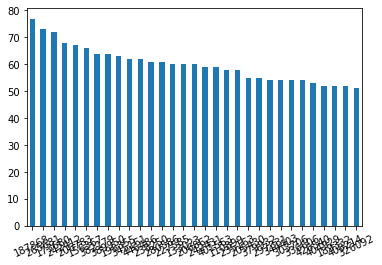

In [58]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [59]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

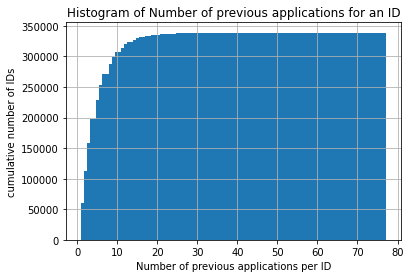

In [60]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [61]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [62]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])

In [63]:
df

,A,B,C
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,7.0,8.0,9.0
3,NaN,NaN,NaN


In [64]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

,A,B
sum,12.0,NaN
min,1.0,2.0
max,NaN,8.0


In [65]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
df

,A,B,C
0,1,1,-0.479353
1,1,2,0.356213
2,2,3,-1.484865
3,2,4,0.941989


In [66]:
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

B             C
  min max       sum
A                  
1   1   2 -0.123139
2   3   4 -0.542876

In [67]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [68]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

{'a': 'a_max', 'b': 'b_max', 'c': 'c_max'}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [69]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [70]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## Missing values in prevApps

In [71]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [72]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## feature engineering for prevApp table

In [73]:
#agg_op_features

## feature transformer for prevApp table

## Join the labeled dataset

In [74]:
~3==3

False

In [75]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

## Join the unlabeled dataset (i.e., the submission file)

In [76]:
# approval rate 'NFLAG_INSURED_ON_APPROVAL'

In [77]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [78]:
# Categorical boolean mask
categorical_feature_mask = df.dtypes==object
categorical_feature_mask

A    False
B    False
C    False
dtype: bool

### OHE case study: The breast cancer wisconsin dataset (classification)

In [79]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer(return_X_y=False)
X, y = load_breast_cancer(return_X_y=True)
print(y[[10, 50, 85]])
#([0, 1, 0])
list(data.target_names)
#['malignant', 'benign']
X.shape

[0 1 0]


(569, 30)

In [80]:
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

Please [this  blog](https://medium.com/hugo-ferreiras-blog/dealing-with-categorical-features-in-machine-learning-1bb70f07262d) for more details of OHE when the validation/test have previously unseen unique values.

## HCDR preprocessing

In [81]:
# Create a class to select numerical or categorical columns 
# since Scikit-Learn doesn't handle DataFrames yet
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

In [82]:
# Identify the numeric features we wish to consider. 
num_attribs = [
    'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
    'EXT_SOURCE_2','EXT_SOURCE_3']

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        #('imputer', SimpleImputer(strategy='most_frequent')),
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
              



In [83]:
list(datasets["application_train"].columns)

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

# Our Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

In [84]:
# imports
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import re
from time import time
from scipy import stats
import json

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.metrics import make_scorer, roc_auc_score, log_loss, accuracy_score
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import confusion_matrix

from IPython.display import display, Math, Latex

In [85]:
df = application_train
df.head()


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [86]:
y = df['TARGET']
x = df.drop(columns='TARGET')

## Building Logistic Regression baseline pipeline


In [87]:
results = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", "AUC", "Train Time(s)", "Test Time(s)", "Validation Time(s)","Experiment description"])

def pct(x):
    return round(100*x,1)


class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values


def returnModel(x,y,results,description_text):
    num_attribs = []
    cat_attribs = []

    for col in x.columns.tolist():
        if x[col].dtype in (['int','float']):
            num_attribs.append(col)
        else:
            cat_attribs.append(col)
            
    le_dict = {}
    for col in x.columns.tolist():
        if df[col].dtype == 'object':
            le = LabelEncoder()
            x[col] = x[col].fillna("NULL")
            x[col] = le.fit_transform(x[col])
            le_dict['le_{}'.format(col)] = le

    num_pipeline =Pipeline([('selector',DataFrameSelector(num_attribs)),
                           ('scaler', StandardScaler()),
                          ('imputer', SimpleImputer(strategy = 'median'))
                           ])
    
    
    cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent'))
    ])
    
    
    full_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ]) 
    
    np.random.seed(42)
    full_pipeline_with_predictor = Pipeline([
            ("preparation", num_pipeline),
            ("linear", LogisticRegression(random_state=42))
        ])
            
    # split 20% test data with random seed set to 42 for correct results
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)
    x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, random_state=42)
    print("train data set: ")
    print(x_train.shape,y_train.shape)
    print("test data set: ")
    print(x_test.shape,y_test.shape)
    print("validation data set: ")
    print(x_valid.shape,y_valid.shape)
    
            
    start = time()
    full_pipeline_with_predictor.fit(x_train, y_train)
    np.random.seed(42)

    cv30Splits = ShuffleSplit(n_splits = 30, test_size = 0.3, random_state = 0)
    logit_scores = cross_val_score(full_pipeline_with_predictor, x_train, y_train, cv = cv30Splits)              
    logit_score_train = logit_scores.mean()
    train_time = np.round(time() - start, 4)

    # Time and score test predictions
    start = time()
    logit_score_test  = full_pipeline_with_predictor.score(x_test, y_test)
    test_time = np.round(time() - start, 4)
    
    start = time()
    logit_score_valid  = full_pipeline_with_predictor.score(x_valid, y_valid)
    valid_time = np.round(time() - start, 4)
    
    AUC = roc_auc_score(y_test,full_pipeline_with_predictor.predict(x_test))
    print("AUC is {}".format(AUC))
    print("\n............\n")
    print("Confusion Matrix: {}".format(confusion_matrix(y_test, full_pipeline_with_predictor.predict(x_test))))
    
    no_of_inputs = x.shape[1]
    
    temp_df = pd.DataFrame()
    temp_df = temp_df.append(pd.Series(["Baseline with {} inputs".format(no_of_inputs), pct(logit_score_train), pct(logit_score_test), pct(logit_score_valid),
                  AUC, train_time, test_time, valid_time, "{} - Untuned LogisticRegression".format(description_text)]),ignore_index=True)
    temp_df.columns = results.columns
    
    results = results.append(temp_df,ignore_index=True)
    
    return le_dict, full_pipeline_with_predictor, results


### Loss function used (data loss and regularization parts) in latex

In [88]:
display(Math(r'[L_\varepsilon(y,f(x,w))=\max\{0, |y-f(x,w)|-\varepsilon\}]'))

<IPython.core.display.Math object>

In [89]:
le_dict, full_pipeline_with_predictor, results = returnModel(x,y,results,"Unbalanced Dataset")

train data set: 
(196806, 121) (196806,)
test data set: 
(61503, 121) (61503,)
validation data set: 
(49202, 121) (49202,)
AUC is 0.5034324684759044

............

Confusion Matrix: [[56508    46]
 [ 4911    38]]


In [90]:
results

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Validation Time(s),Experiment description
0,Baseline with 121 inputs,92.0,91.9,91.8,0.503432,82.2671,0.253,0.1086,Unbalanced Dataset - Untuned LogisticRegression


## Submission 1

In [91]:
test_data_set = application_test
test_data_set.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
for col in test_data_set.columns.tolist():
    for le in le_dict:
        if col in le:
            test_data_set[col] = le_dict[le].fit_transform(test_data_set[col])

In [93]:
output_data = test_data_set[['SK_ID_CURR']]
output_data['TARGET'] = pd.Series(full_pipeline_with_predictor.predict(test_data_set).tolist())


In [94]:
output_data['TARGET'].value_counts()


0    48695
1       49
Name: TARGET, dtype: int64

In [95]:
output_data.to_csv('./outputphase1.csv', index=False)

## Improving the AUC


In [96]:
df['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [97]:
final_data = df[df['TARGET']==1]
final_data = final_data.append(df[df['TARGET']==0].reset_index(drop=True).sample(n = 50000))
print(final_data.shape)
final_data.head()

(74825, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [98]:
x = final_data.drop(columns='TARGET')
y = final_data['TARGET']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2, shuffle=True, random_state=42)
print(x_train.shape,y_train.shape)

(59860, 121) (59860,)


In [99]:
le_dict, full_pipeline_with_predictor, results = returnModel(x,y,results,"50000 non-defaulters Balanced Dataset")

train data set: 
(47888, 121) (47888,)
test data set: 
(14965, 121) (14965,)
validation data set: 
(11972, 121) (11972,)
AUC is 0.6286824253693222

............

Confusion Matrix: [[8907 1144]
 [3090 1824]]


In [100]:
results

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Validation Time(s),Experiment description
0,Baseline with 121 inputs,92.0,91.9,91.8,0.503432,82.2671,0.2530,0.1086,Unbalanced Dataset - Untuned LogisticRegression
1,Baseline with 121 inputs,71.6,71.7,72.0,0.628682,22.7210,0.0239,0.0241,50000 non-defaulters Balanced Dataset - Untune...


## Submission 2

In [101]:
#checking across the test dataset

output_data = test_data_set[['SK_ID_CURR']]
output_data['TARGET'] = pd.Series(full_pipeline_with_predictor.predict(test_data_set).tolist())

In [102]:
output_data['TARGET'].value_counts()

0    43723
1     5021
Name: TARGET, dtype: int64

In [103]:
output_data.to_csv('./output_submission_1_phase1.csv', index=False)

### Approach 2

In [104]:
final_data = df[df['TARGET']==1]
final_data = final_data.append(df[df['TARGET']==0].reset_index(drop=True).sample(n = 75000))
print(final_data.shape)
final_data.head()

(99825, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [105]:
x = final_data.drop(columns='TARGET')
y = final_data['TARGET']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2, shuffle=True, random_state=42)
print(x_train.shape,y_train.shape)

(79860, 121) (79860,)


In [106]:
le_dict, full_pipeline_with_predictor, results = returnModel(x,y,results,"75000 non-defaulters Balanced Dataset")

train data set: 
(63888, 121) (63888,)
test data set: 
(19965, 121) (19965,)
validation data set: 
(15972, 121) (15972,)
AUC is 0.5772520859994552

............

Confusion Matrix: [[14204   772]
 [ 3961  1028]]


In [107]:
results


,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Validation Time(s),Experiment description
0,Baseline with 121 inputs,92.0,91.9,91.8,0.503432,82.2671,0.2530,0.1086,Unbalanced Dataset - Untuned LogisticRegression
1,Baseline with 121 inputs,71.6,71.7,72.0,0.628682,22.7210,0.0239,0.0241,50000 non-defaulters Balanced Dataset - Untune...
2,Baseline with 121 inputs,77.0,76.3,76.8,0.577252,28.3269,0.0313,0.0273,75000 non-defaulters Balanced Dataset - Untune...



## Submission 3

In [108]:
#checking for test dataset

In [109]:
output_data = test_data_set[['SK_ID_CURR']]
output_data['TARGET'] = pd.Series(full_pipeline_with_predictor.predict(test_data_set).tolist())

In [110]:
output_data['TARGET'].value_counts()

0    45856
1     2888
Name: TARGET, dtype: int64

# Phase-2

## Feature Engineering 

In [49]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import re
from time import time
from scipy import stats
import json

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.metrics import make_scorer, roc_auc_score, log_loss, accuracy_score
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import confusion_matrix
from IPython.display import display, Math, Latex


from sklearn.linear_model import Lasso,Ridge,LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# Read data from application_train dataset.
data = pd.read_csv('/Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk/application_train.csv')
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
y = data['TARGET']
X = data.drop(['SK_ID_CURR','TARGET'], axis = 1)

In [51]:
experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])

def pct(x):
    return round(100*x,1)


class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values


def returnModel(x,y,experimentLog,description_text):
    num_attribs = []
    cat_attribs = []

    for col in x.columns.tolist():
        if x[col].dtype in (['int','float']):
            num_attribs.append(col)
        else:
            cat_attribs.append(col)
            
    le_dict = {}
    for col in x.columns.tolist():
        if X[col].dtype == 'object':
            le = LabelEncoder()
            x[col] = x[col].fillna("NULL")
            x[col] = le.fit_transform(x[col])
            le_dict['le_{}'.format(col)] = le

    num_pipeline =Pipeline([('selector',DataFrameSelector(num_attribs)),
                           ('scaler', StandardScaler()),
                          ('imputer', SimpleImputer(strategy = 'median'))
                           ])
    
    
    cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent'))
    ])
    
    
    full_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ]) 
    
    np.random.seed(42)
    full_pipeline_with_predictor = Pipeline([
            ("preparation", num_pipeline),
            ("linear", LogisticRegression(random_state=42))
        ])
            
    # split 20% test data with random seed set to 42 for correct experimentLog
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)
    x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, random_state=42)
    print("train data set: ")
    print(x_train.shape,y_train.shape)
    print("test data set: ")
    print(x_test.shape,y_test.shape)
    print("validation data set: ")
    print(x_valid.shape,y_valid.shape)
    
            
    start = time()
    full_pipeline_with_predictor.fit(x_train, y_train)
    np.random.seed(42)

    cv30Splits = ShuffleSplit(n_splits = 30, test_size = 0.3, random_state = 0)
    logit_scores = cross_val_score(full_pipeline_with_predictor, x_train, y_train, cv = cv30Splits)              
    logit_score_train = logit_scores.mean()
    train_time = np.round(time() - start, 4)

    # Time and score test predictions
    start = time()
    logit_score_test  = full_pipeline_with_predictor.score(x_test, y_test)
    test_time = np.round(time() - start, 4)
    
    start = time()
    logit_score_valid  = full_pipeline_with_predictor.score(x_valid, y_valid)
    valid_time = np.round(time() - start, 4)
    
    AUC = roc_auc_score(y_test,full_pipeline_with_predictor.predict(x_test))
    print("AUC is {}".format(AUC))
    print("\n............\n")
    print("Confusion Matrix: {}".format(confusion_matrix(y_test, full_pipeline_with_predictor.predict(x_test))))
    
    no_of_inputs = x.shape[1]
    
    temp_df = pd.DataFrame()
    temp_df = temp_df.append(pd.Series(["Baseline with {} inputs".format(no_of_inputs), pct(logit_score_train), pct(logit_score_test), pct(logit_score_valid),
                  AUC, train_time, test_time, "{} - Baseline LogisticRegression".format(description_text)]),ignore_index=True)
    temp_df.columns = experimentLog.columns
    
    experimentLog = experimentLog.append(temp_df,ignore_index=True)
    
    return le_dict, full_pipeline_with_predictor, experimentLog

In [52]:
le_dict, full_pipeline_with_predictor, experimentLog = returnModel(X,y,experimentLog,"All features Dataset")

train data set: 
(196806, 120) (196806,)
test data set: 
(61503, 120) (61503,)
validation data set: 
(49202, 120) (49202,)
AUC is 0.5043329019692199

............

Confusion Matrix: [[56507    47]
 [ 4902    47]]


In [53]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.104,All features Dataset - Baseline LogisticRegres...


In [98]:
from xgboost import XGBClassifier

In [101]:
experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])

def pct(x):
    return round(100*x,1)


class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values


def returnModel(x,y,experimentLog,description_text):
    num_attribs = []
    cat_attribs = []

    for col in x.columns.tolist():
        if x[col].dtype in (['int','float']):
            num_attribs.append(col)
        else:
            cat_attribs.append(col)
            
    le_dict = {}
    for col in x.columns.tolist():
        if X[col].dtype == 'object':
            le = LabelEncoder()
            x[col] = x[col].fillna("NULL")
            x[col] = le.fit_transform(x[col])
            le_dict['le_{}'.format(col)] = le

    num_pipeline =Pipeline([('selector',DataFrameSelector(num_attribs)),
                           ('scaler', StandardScaler()),
                          ('imputer', SimpleImputer(strategy = 'median'))
                           ])
    
    
    cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent'))
    ])
    
    
    full_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ]) 
    
    np.random.seed(42)
    full_pipeline_with_predictor = Pipeline([
            ("preparation", num_pipeline),
            ("xgboost", XGBClassifier())
        ])
            
    # split 20% test data with random seed set to 42 for correct experimentLog
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)
    x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, random_state=42)
    print("train data set: ")
    print(x_train.shape,y_train.shape)
    print("test data set: ")
    print(x_test.shape,y_test.shape)
    print("validation data set: ")
    print(x_valid.shape,y_valid.shape)
    
            
    start = time()
    full_pipeline_with_predictor.fit(x_train, y_train)
    np.random.seed(42)

    cv30Splits = ShuffleSplit(n_splits = 30, test_size = 0.3, random_state = 0)
    logit_scores = cross_val_score(full_pipeline_with_predictor, x_train, y_train, cv = cv30Splits)              
    logit_score_train = logit_scores.mean()
    train_time = np.round(time() - start, 4)

    # Time and score test predictions
    start = time()
    logit_score_test  = full_pipeline_with_predictor.score(x_test, y_test)
    test_time = np.round(time() - start, 4)
    
    start = time()
    logit_score_valid  = full_pipeline_with_predictor.score(x_valid, y_valid)
    valid_time = np.round(time() - start, 4)
    
    AUC = roc_auc_score(y_test,full_pipeline_with_predictor.predict(x_test))
    print("AUC is {}".format(AUC))
    print("\n............\n")
    print("Confusion Matrix: {}".format(confusion_matrix(y_test, full_pipeline_with_predictor.predict(x_test))))
    
    no_of_inputs = x.shape[1]
    
    temp_df = pd.DataFrame()
    temp_df = temp_df.append(pd.Series(["Baseline XGBoost with {} inputs".format(no_of_inputs), pct(logit_score_train), pct(logit_score_test), pct(logit_score_valid),
                  AUC, train_time, test_time, "{} - Baseline XgBoost".format(description_text)]),ignore_index=True)
    temp_df.columns = experimentLog.columns
    
    experimentLog = experimentLog.append(temp_df,ignore_index=True)
    
    return le_dict, full_pipeline_with_predictor, experimentLog

In [102]:
le_dict, full_pipeline_with_predictor, experimentLog = returnModel(X,y,experimentLog,"All features Dataset")

train data set: 
(196798, 79) (196798,)
test data set: 
(61500, 79) (61500,)
validation data set: 
(49200, 79) (49200,)
AUC is 0.5657728128047379

............

Confusion Matrix: [[56225   317]
 [ 4278   680]]


In [103]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 79 inputs,92.5,92.5,92.5,0.565773,735.4382,0.1411,All features Dataset - Baseline XgBoost


### Additional EDA

### Discarding features with null values more than 30%

In [54]:
null_data = X.isna().sum().reset_index().rename(columns={'index':'col_name',0:'null_count'})
null_data['count_%'] = null_data['null_count']/len(X)*100
null_data = null_data[null_data['count_%'] <= 30]
null_data


,col_name,null_count,count_%
0,NAME_CONTRACT_TYPE,0,0.000000
1,CODE_GENDER,0,0.000000
2,FLAG_OWN_CAR,0,0.000000
3,FLAG_OWN_REALTY,0,0.000000
4,CNT_CHILDREN,0,0.000000
...,...,...,...
115,AMT_REQ_CREDIT_BUREAU_DAY,41519,13.501631
116,AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.501631
117,AMT_REQ_CREDIT_BUREAU_MON,41519,13.501631
118,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.501631


In [55]:
selected_columns = null_data['col_name'].tolist() + ['TARGET']
print(selected_columns)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCL

In [56]:
null_data['col_type'] = null_data['col_name'].apply(lambda x: X[x].dtype)
null_data[null_data['count_%'] > 0]

,col_name,null_count,count_%,col_type
7,AMT_ANNUITY,12,0.003902,float64
8,AMT_GOODS_PRICE,278,0.090403,float64
27,CNT_FAM_MEMBERS,2,0.000650,float64
40,EXT_SOURCE_2,660,0.214626,float64
41,EXT_SOURCE_3,60965,19.825307,float64
89,OBS_30_CNT_SOCIAL_CIRCLE,1021,0.332021,float64
90,DEF_30_CNT_SOCIAL_CIRCLE,1021,0.332021,float64
91,OBS_60_CNT_SOCIAL_CIRCLE,1021,0.332021,float64
92,DEF_60_CNT_SOCIAL_CIRCLE,1021,0.332021,float64
93,DAYS_LAST_PHONE_CHANGE,1,0.000325,float64


### Filling null values in NAME_TYPE_SUITE column with "Other_C"

In [57]:
X_feature = data[selected_columns]
X_feature['NAME_TYPE_SUITE'].fillna('Other_C', inplace=True) 
X_feature.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
4,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0


### Filling null values in the columns containing keyword AMT_REQ_CREDIT column with 0

In [58]:
temp_col_reqd = null_data[null_data['null_count'] != 0].reset_index(drop=True)['col_name'].tolist()
for col in temp_col_reqd:
    if 'AMT_REQ_CREDIT' in col:
        print("columns to be filled with 0 is: {}".format(col))
        X_feature[col].fillna(0,inplace=True) 

columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_HOUR
columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_DAY
columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_WEEK
columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_MON
columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_QRT
columns to be filled with 0 is: AMT_REQ_CREDIT_BUREAU_YEAR


### Filling null values in the column containing keyword CNT_SOCIAL_CIRCLE with 0¶

In [59]:
for col in temp_col_reqd:
    if 'CNT_SOCIAL_CIRCLE' in col:
        print("columns to be filled with 0 is: {}".format(col))
        X_feature[col].fillna(0,inplace=True)   

columns to be filled with 0 is: OBS_30_CNT_SOCIAL_CIRCLE
columns to be filled with 0 is: DEF_30_CNT_SOCIAL_CIRCLE
columns to be filled with 0 is: OBS_60_CNT_SOCIAL_CIRCLE
columns to be filled with 0 is: DEF_60_CNT_SOCIAL_CIRCLE


### Filling null values in the column CNT_FAM_MEMBERS with median

In [60]:
for col in temp_col_reqd:
    if 'CNT_FAM_MEMBERS' in col:
        print("columns to be filled with median is: {}".format(col))
        X_feature[col].fillna(X_feature[col].median(),inplace=True) 

columns to be filled with median is: CNT_FAM_MEMBERS


### Filling null values in the column AMT_GOODS_PRICE with median fopr the respective category

In [61]:
temp_plt_data = X_feature[['AMT_GOODS_PRICE','NAME_FAMILY_STATUS']]
temp_plt_data = temp_plt_data.groupby('NAME_FAMILY_STATUS')['AMT_GOODS_PRICE'].median().reset_index()
temp_plt_data['AMT_GOODS_PRICE'] = temp_plt_data['AMT_GOODS_PRICE'].fillna(temp_plt_data['AMT_GOODS_PRICE'].min())
temp_plt_data.head()

,NAME_FAMILY_STATUS,AMT_GOODS_PRICE
0,Civil marriage,450000.0
1,Married,459000.0
2,Separated,450000.0
3,Single / not married,373500.0
4,Unknown,360000.0


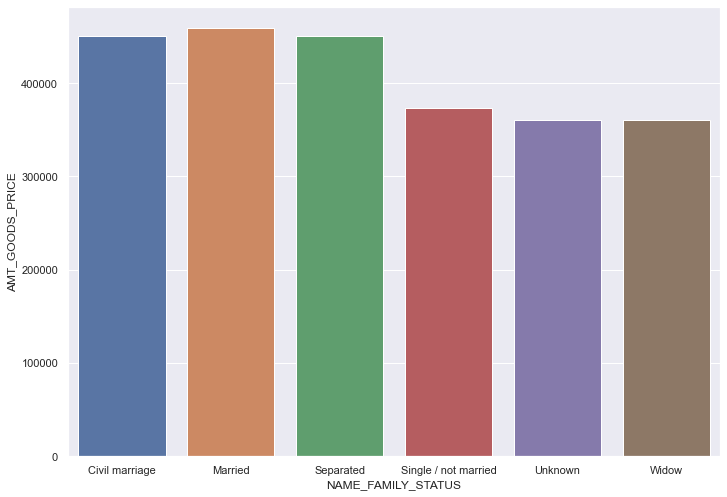

In [62]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.barplot(x="NAME_FAMILY_STATUS", y="AMT_GOODS_PRICE", data=temp_plt_data)

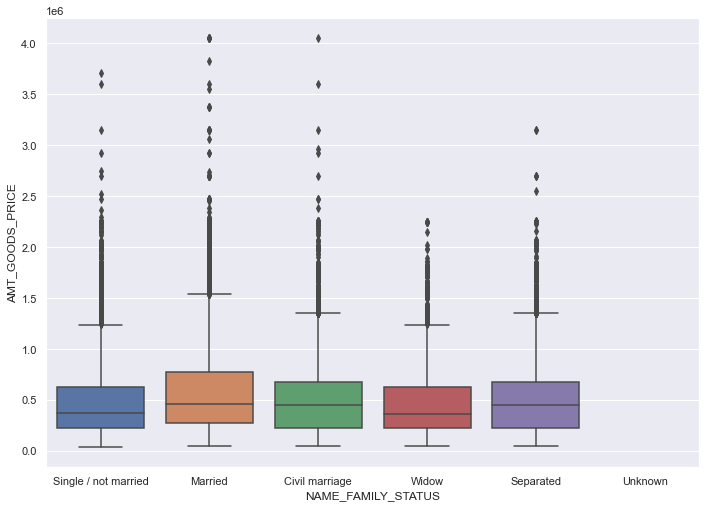

In [63]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.boxplot(x="NAME_FAMILY_STATUS", y="AMT_GOODS_PRICE", data=X_feature)

In [64]:
def fill_category_value(a):
    if a['AMT_GOODS_PRICE'] == np.inf:
        return temp_plt_data[temp_plt_data['NAME_FAMILY_STATUS']==a['NAME_FAMILY_STATUS']]['AMT_GOODS_PRICE'].values[0]
    else:
        return a['AMT_GOODS_PRICE']

for col in temp_col_reqd:
    X_feature['AMT_GOODS_PRICE'] = X_feature['AMT_GOODS_PRICE'].fillna(np.inf)
    if 'AMT_GOODS_PRICE' in col:
        print("columns to be filled with category median is: {}".format(col))
        X_feature['AMT_GOODS_PRICE'] = X_feature.apply(lambda a: fill_category_value(a),axis=1)

columns to be filled with category median is: AMT_GOODS_PRICE


### Dropping one single row with column DAYS_LAST_PHONE_CHANGE as null

In [65]:
X_feature.dropna(subset=['DAYS_LAST_PHONE_CHANGE'], inplace=True)

### Dropping 12 rows with column AMT_ANNUITY as null

In [66]:
X_feature.dropna(subset=['AMT_ANNUITY'], inplace=True)
X_feature = X_feature.reset_index(drop=True)

### Checking highest correlated features with External Source to replace the null values with

In [67]:
### Check for EXT_SOURCE_2

In [68]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

temp_corr_df = pd.DataFrame()

for col in X_feature.columns.tolist():
    if X_feature[col].dtype == 'int':
        l = [col, X_feature['EXT_SOURCE_2'].corr(X_feature[col])]
    else:
        l = [col, X_feature['EXT_SOURCE_2'].corr(pd.DataFrame(LabelEncoder().fit_transform(X_feature[[col]]))[0])]
    temp_corr_df = temp_corr_df.append(pd.Series(l),ignore_index=True)
temp_corr_df = temp_corr_df.rename(columns={0:'col_name',1:'correlation_with_EXT_2'})
temp_corr_df['correlation_with_EXT_2'] = abs(temp_corr_df['correlation_with_EXT_2'])
temp_corr_df.sort_values(by='correlation_with_EXT_2',ascending=False).head(6).tail(5)

,col_name,correlation_with_EXT_2
27,REGION_RATING_CLIENT,0.292903
28,REGION_RATING_CLIENT_W_CITY,0.288306
48,DAYS_LAST_PHONE_CHANGE,0.195766
5,AMT_INCOME_TOTAL,0.170547
75,TARGET,0.160471


In [69]:
#REGION_RATING_CLIENT : Our rating of the region where our client lives

In [70]:
region_rating_grouped = X_feature.groupby('REGION_RATING_CLIENT')['EXT_SOURCE_2'].median().reset_index()


def fill_external_source2(a):
    if a['EXT_SOURCE_2'] == np.inf:
        return region_rating_grouped[region_rating_grouped['REGION_RATING_CLIENT']==a['REGION_RATING_CLIENT']]['EXT_SOURCE_2'].values[0]
    else:
        return a['EXT_SOURCE_2']

X_feature['EXT_SOURCE_2'] = X_feature['EXT_SOURCE_2'].fillna(np.inf)
X_feature['EXT_SOURCE_2'] = X_feature.apply(lambda a: fill_external_source2(a),axis=1)


In [71]:
#Check for EXT_SOURCE_3

In [72]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

temp_corr_df = pd.DataFrame()

for col in X_feature.columns.tolist():
    if X_feature[col].dtype == 'int':
        l = [col, X_feature['EXT_SOURCE_3'].corr(X_feature[col])]
    else:
        l = [col, X_feature['EXT_SOURCE_3'].corr(pd.DataFrame(LabelEncoder().fit_transform(X_feature[[col]]))[0])]
    temp_corr_df = temp_corr_df.append(pd.Series(l),ignore_index=True)
temp_corr_df = temp_corr_df.rename(columns={0:'col_name',1:'correlation_with_EXT_3'})
temp_corr_df['correlation_with_EXT_3'] = abs(temp_corr_df['correlation_with_EXT_3'])
temp_corr_df = temp_corr_df.sort_values(by='correlation_with_EXT_3',ascending=False).head(10).tail(9)
temp_corr_df

,col_name,correlation_with_EXT_3
15,DAYS_BIRTH,0.205474
75,TARGET,0.178929
18,DAYS_ID_PUBLISH,0.131598
20,FLAG_EMP_PHONE,0.115284
16,DAYS_EMPLOYED,0.113426
38,EXT_SOURCE_2,0.109728
17,DAYS_REGISTRATION,0.107570
5,AMT_INCOME_TOTAL,0.088906
37,ORGANIZATION_TYPE,0.087994


In [73]:
ext_source_data = X_feature[temp_corr_df['col_name'].tolist()+['EXT_SOURCE_3']]

for col in ext_source_data.columns.tolist():
    if col != 'EXT_SOURCE_3':
        ext_source_data[col] = LabelEncoder().fit_transform(X_feature[[col]])

ext_source3_train = ext_source_data[ext_source_data['EXT_SOURCE_3'].notnull()]
ext_source3_test = ext_source_data[ext_source_data['EXT_SOURCE_3'].isnull()]
ext_source3_train.shape, ext_source3_test.shape

((246535, 10), (60963, 10))

In [74]:
exs3_y_train = ext_source3_train[['EXT_SOURCE_3']]
exs3_X_train = ext_source3_train.drop(columns=['EXT_SOURCE_3'])

exs3_X_test = ext_source3_test.drop(columns=['EXT_SOURCE_3'])

In [75]:
from sklearn.linear_model import LinearRegression

model = LinearRegression().fit(exs3_X_train, exs3_y_train) 
y_pred_exs3 = model.predict(exs3_X_test)

exs3_output = exs3_X_test
exs3_output['exs3_y'] = y_pred_exs3
exs3_output

,DAYS_BIRTH,TARGET,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,DAYS_EMPLOYED,EXT_SOURCE_2,DAYS_REGISTRATION,AMT_INCOME_TOTAL,ORGANIZATION_TYPE,exs3_y
1,8382,0,5876,1,11384,85079,14501,2064,39,0.472053
3,6142,0,3730,1,9533,90559,5854,1170,5,0.558360
4,5215,0,2709,1,9534,36021,11376,1019,37,0.548182
9,10676,0,2175,1,10553,110724,1373,1170,9,0.557395
14,10562,0,4111,1,12369,89028,15072,1659,53,0.486558
...,...,...,...,...,...,...,...,...,...,...
307471,12298,0,6132,1,12244,109216,13156,2398,5,0.437183
307488,12184,0,2387,1,11526,76369,14289,506,14,0.521215
307491,8442,0,5908,1,5318,68374,5889,1371,42,0.529196
307493,15818,0,4185,1,12336,96856,7231,1407,43,0.473263


In [76]:
exs3_output = exs3_output.reset_index().rename(columns={'index':'index_to_be_updated'})
for i in exs3_output['index_to_be_updated'].tolist():
    X_feature['EXT_SOURCE_3'].iloc[i] = exs3_output[exs3_output['index_to_be_updated']==i]['exs3_y'].values[0]

### Checking the null values in the Train dataset

In [77]:
new_null_data = X_feature.isna().sum().reset_index().rename(columns={'index':'col_name',0:'null_count'})
new_null_data['count_%'] = new_null_data['null_count']/len(X_feature)*100
new_null_data = new_null_data[new_null_data['count_%'] <= 30]
new_null_data['col_type'] = new_null_data['col_name'].apply(lambda x: X_feature[x].dtype)
new_null_data[new_null_data['count_%'] > 0]

,col_name,null_count,count_%,col_type


In [78]:
X_feature.isna().sum()

NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
FLAG_OWN_REALTY               0
CNT_CHILDREN                  0
                             ..
AMT_REQ_CREDIT_BUREAU_WEEK    0
AMT_REQ_CREDIT_BUREAU_MON     0
AMT_REQ_CREDIT_BUREAU_QRT     0
AMT_REQ_CREDIT_BUREAU_YEAR    0
TARGET                        0
Length: 76, dtype: int64

### Training and testing with the selected columns

### Adding Additional relevant features felt

In [79]:
X_feature['AMT_CREDIT_TO_ANNUITY_RATIO'] = X_feature['AMT_CREDIT'] / X_feature['AMT_ANNUITY']
X_feature['Tot_EXTERNAL_SOURCE'] = X_feature['EXT_SOURCE_2'] + X_feature['EXT_SOURCE_3']
X_feature['Salary_to_credit'] = X_feature['AMT_INCOME_TOTAL']/X_feature['AMT_CREDIT']
X_feature['Annuity_to_salary_ratio'] = X_feature['AMT_ANNUITY']/X_feature['AMT_INCOME_TOTAL']

In [80]:
y = X_feature[['TARGET']]
X = X_feature.drop(['TARGET'], axis = 1)

In [81]:
le_dict, full_pipeline_with_predictor, experimentLog = returnModel(X,y,experimentLog,"Selected features Dataset")

train data set: 
(196798, 79) (196798, 1)
test data set: 
(61500, 79) (61500, 1)
validation data set: 
(49200, 79) (49200, 1)
AUC is 0.5055379338757116

............

Confusion Matrix: [[56484    58]
 [ 4898    60]]


In [82]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.1040,All features Dataset - Baseline LogisticRegres...
1,Baseline with 79 inputs,91.9,91.9,91.8,0.505538,48.0740,0.0551,Selected features Dataset - Baseline LogisticR...


## Hyperparameter tuning(Grid Search)

In [83]:
train = X_feature
train.shape

(307498, 80)

In [84]:
features = train.columns.tolist()
features.remove('TARGET')
len(features)

79

In [85]:
le_dict = {}

for col in features:
    if train[col].dtype == 'object':
        le = LabelEncoder()
        train[col] = le.fit_transform(train[col])
        le_dict['le_{}'.format(col)] = le
X = train[features]
y = train['TARGET']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

## Decision Making Tree

In [86]:
DMT_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', DecisionTreeClassifier())
])

param_grid = [{
    'regressor__max_depth': [2,4,6,8,10,12],
    'regressor__criterion': ['gini','entropy'],
}]

start = time()
dmt_search = GridSearchCV(estimator=DMT_pipe, param_grid=param_grid, cv=2)
dmt_search.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = dmt_search.score(X_train, y_train)
validAcc  = dmt_search.score(X_valid, y_valid)
start = time()
testAcc  = dmt_search.score(X_test, y_test)
test_time = np.round(time() - start, 4)

number_of_inputs = X_train.shape[1]
AUC = roc_auc_score(y_test,dmt_search.predict(X_test))

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", 
                                               "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])
experimentLog.loc[len(experimentLog)] =[f"Gridsearch Decision Making Tree with {number_of_inputs} inputs", 
                                        f"{trainAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", AUC, 
                                        train_time, test_time,
                                        "Decision Making Tree GridSearch with selected features from Lasso/Ridge"]

In [87]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.1040,All features Dataset - Baseline LogisticRegres...
1,Baseline with 79 inputs,91.9,91.9,91.8,0.505538,48.0740,0.0551,Selected features Dataset - Baseline LogisticR...
2,Gridsearch Decision Making Tree with 79 inputs,92.07%,92.08%,92.01%,0.534083,31.9433,0.0146,Decision Making Tree GridSearch with selected ...


In [88]:
test_data=pd.read_csv('/Users/nidhisaduvala/Desktop/Spring/AML/home-credit-default-risk/application_test.csv')

## Lasso Regression

In [89]:
lasso_pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso())
])


lasso_pipeline = GridSearchCV(lasso_pipeline,
                      {'model__alpha':[0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10]},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )

start = time()
lasso_pipeline.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = lasso_pipeline.score(X_train, y_train)
validAcc  = lasso_pipeline.score(X_valid, y_valid)
start = time()
testAcc  = lasso_pipeline.score(X_test, y_test)
test_time = np.round(time() - start, 4)

AUC = roc_auc_score(y_test,lasso_pipeline.predict(X_test))
number_of_inputs = X_train.shape[1]

#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", 
                                               "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])
experimentLog.loc[len(experimentLog)] =[f"Lasso Reg with {number_of_inputs} inputs", 
                                        f"{trainAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", AUC, 
                                        train_time, test_time,
                                        "Lasso Regression for feature selection"]

Fitting 5 folds for each of 22 candidates, totalling 110 fits
[CV 1/5] END ............................model__alpha=0.0001; total time=   8.3s
[CV 2/5] END ............................model__alpha=0.0001; total time=   8.1s
[CV 3/5] END ............................model__alpha=0.0001; total time=   8.9s
[CV 4/5] END ............................model__alpha=0.0001; total time=   8.7s
[CV 5/5] END ............................model__alpha=0.0001; total time=   8.8s
[CV 1/5] END .............................model__alpha=0.001; total time=   1.0s
[CV 2/5] END .............................model__alpha=0.001; total time=   0.9s
[CV 3/5] END .............................model__alpha=0.001; total time=   0.9s
[CV 4/5] END .............................model__alpha=0.001; total time=   1.1s
[CV 5/5] END .............................model__alpha=0.001; total time=   0.8s
[CV 1/5] END ..............................model__alpha=0.01; total time=   0.3s
[CV 2/5] END ..............................mode

[CV 3/5] END .................................model__alpha=9; total time=   0.2s
[CV 4/5] END .................................model__alpha=9; total time=   0.2s
[CV 5/5] END .................................model__alpha=9; total time=   0.2s
[CV 1/5] END ................................model__alpha=10; total time=   0.2s
[CV 2/5] END ................................model__alpha=10; total time=   0.2s
[CV 3/5] END ................................model__alpha=10; total time=   0.2s
[CV 4/5] END ................................model__alpha=10; total time=   0.2s
[CV 5/5] END ................................model__alpha=10; total time=   0.2s


In [90]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.1040,All features Dataset - Baseline LogisticRegres...
1,Baseline with 79 inputs,91.9,91.9,91.8,0.505538,48.0740,0.0551,Selected features Dataset - Baseline LogisticR...
2,Gridsearch Decision Making Tree with 79 inputs,92.07%,92.08%,92.01%,0.534083,31.9433,0.0146,Decision Making Tree GridSearch with selected ...
3,Lasso Reg with 79 inputs,-6.89%,-6.87%,-6.89%,0.755827,73.1354,0.0192,Lasso Regression for feature selection


In [91]:
print(lasso_pipeline.best_params_)
coefficients = lasso_pipeline.best_estimator_.named_steps['model'].coef_
importance = np.abs(coefficients)
len(np.array(features)[importance > 0])


{'model__alpha': 0.0001}


74

## Ridge Regression

In [92]:
ridge_pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Ridge())
])


ridge_pipeline = GridSearchCV(ridge_pipeline,
                      {'model__alpha':[0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10]},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )

start = time()
ridge_pipeline.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = ridge_pipeline.score(X_train, y_train)
validAcc  = ridge_pipeline.score(X_valid, y_valid)
start = time()
testAcc  = ridge_pipeline.score(X_test, y_test)
test_time = np.round(time() - start, 4)

AUC = roc_auc_score(y_test,ridge_pipeline.predict(X_test))
number_of_inputs = X_train.shape[1]

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", 
                                               "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])
experimentLog.loc[len(experimentLog)] =[f"Ridge Reg with {number_of_inputs} inputs", 
                                        f"{trainAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", AUC, 
                                        train_time, test_time,
                                        "Ridge Regression for feature selection"]

Fitting 5 folds for each of 22 candidates, totalling 110 fits
[CV 1/5] END ............................model__alpha=0.0001; total time=   0.2s
[CV 2/5] END ............................model__alpha=0.0001; total time=   0.2s
[CV 3/5] END ............................model__alpha=0.0001; total time=   0.2s
[CV 4/5] END ............................model__alpha=0.0001; total time=   0.2s
[CV 5/5] END ............................model__alpha=0.0001; total time=   0.2s
[CV 1/5] END .............................model__alpha=0.001; total time=   0.2s
[CV 2/5] END .............................model__alpha=0.001; total time=   0.2s
[CV 3/5] END .............................model__alpha=0.001; total time=   0.2s
[CV 4/5] END .............................model__alpha=0.001; total time=   0.2s
[CV 5/5] END .............................model__alpha=0.001; total time=   0.2s
[CV 1/5] END ..............................model__alpha=0.01; total time=   0.2s
[CV 2/5] END ..............................mode

[CV 3/5] END .................................model__alpha=9; total time=   0.2s
[CV 4/5] END .................................model__alpha=9; total time=   0.2s
[CV 5/5] END .................................model__alpha=9; total time=   0.2s
[CV 1/5] END ................................model__alpha=10; total time=   0.2s
[CV 2/5] END ................................model__alpha=10; total time=   0.2s
[CV 3/5] END ................................model__alpha=10; total time=   0.2s
[CV 4/5] END ................................model__alpha=10; total time=   0.2s
[CV 5/5] END ................................model__alpha=10; total time=   0.2s


In [93]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.1040,All features Dataset - Baseline LogisticRegres...
1,Baseline with 79 inputs,91.9,91.9,91.8,0.505538,48.0740,0.0551,Selected features Dataset - Baseline LogisticR...
2,Gridsearch Decision Making Tree with 79 inputs,92.07%,92.08%,92.01%,0.534083,31.9433,0.0146,Decision Making Tree GridSearch with selected ...
3,Lasso Reg with 79 inputs,-6.89%,-6.87%,-6.89%,0.755827,73.1354,0.0192,Lasso Regression for feature selection
4,Ridge Reg with 79 inputs,-6.89%,-6.87%,-6.89%,0.756776,20.3458,0.0109,Ridge Regression for feature selection


In [94]:
print(ridge_pipeline.best_params_)
coefficients = ridge_pipeline.best_estimator_.named_steps['model'].coef_
importance = np.abs(coefficients)
len(np.array(features)[importance > 0.005])

{'model__alpha': 3}


22

## Logistic Regression

In [96]:
#logistic = LogisticRegression(max_iter=10000, tol=0.1)
logistic = LogisticRegression()
clf_pipe = Pipeline(steps=[("logistic", logistic)])
param_grid = {
    'logistic__penalty': ['l1','l2'],
    "logistic__C": np.logspace(-4, 4, 10, 20)
}


# Time and score test predictions
start = time()

clf_search = GridSearchCV(clf_pipe, param_grid, n_jobs=-1)
clf_search.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_search.score(X_train, y_train)
validAcc  = clf_search.score(X_valid, y_valid)
start = time()
testAcc  = clf_search.score(X_test, y_test)
test_time = np.round(time() - start, 4)

number_of_inputs = X_train.shape[1]
AUC = roc_auc_score(y_test,clf_search.predict(X_test))

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", 
                                               "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])
experimentLog.loc[len(experimentLog)] =[f"Gridsearch LogReg with {number_of_inputs} inputs", 
                                        f"{trainAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", AUC, 
                                        train_time, test_time,
                                        "LogReg GridSearch with selected features"]


In [97]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 120 inputs,92.0,92.0,91.8,0.504333,75.2722,0.1040,All features Dataset - Baseline LogisticRegres...
1,Baseline with 79 inputs,91.9,91.9,91.8,0.505538,48.0740,0.0551,Selected features Dataset - Baseline LogisticR...
2,Gridsearch Decision Making Tree with 79 inputs,92.07%,92.08%,92.01%,0.534083,31.9433,0.0146,Decision Making Tree GridSearch with selected ...
3,Lasso Reg with 79 inputs,-6.89%,-6.87%,-6.89%,0.755827,73.1354,0.0192,Lasso Regression for feature selection
4,Ridge Reg with 79 inputs,-6.89%,-6.87%,-6.89%,0.756776,20.3458,0.0109,Ridge Regression for feature selection
5,Gridsearch LogReg with 79 inputs,91.91%,91.98%,91.96%,0.500000,40.8086,0.0248,LogReg GridSearch with selected features


### XGBoost

In [107]:
#logistic = LogisticRegression(max_iter=10000, tol=0.1)
xgc = XGBClassifier()
clf_pipe = Pipeline(steps=[("xgc", xgc)])
param_grid = {
    'xgc__learning_rate': [0.10, 0.15, 0.20],
    "xgc__max_depth": [ 4, 6, 10]
}


# Time and score test predictions
start = time()

clf_search = GridSearchCV(clf_pipe, param_grid, n_jobs=-1)
clf_search.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_search.score(X_train, y_train)
validAcc  = clf_search.score(X_valid, y_valid)
start = time()
testAcc  = clf_search.score(X_test, y_test)
test_time = np.round(time() - start, 4)

number_of_inputs = X_train.shape[1]
AUC = roc_auc_score(y_test,clf_search.predict(X_test))

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["ExpID", "Cross fold train accuracy", "Test Accuracy", "Validation Accuracy", 
                                               "AUC", "Train Time(s)", "Test Time(s)","Experiment description"])
experimentLog.loc[len(experimentLog)] =[f"Gridsearch XGboost with {number_of_inputs} inputs", 
                                        f"{trainAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", AUC, 
                                        train_time, test_time,
                                        "LogReg GridSearch with selected features"]


In [108]:
experimentLog

,ExpID,Cross fold train accuracy,Test Accuracy,Validation Accuracy,AUC,Train Time(s),Test Time(s),Experiment description
0,Baseline with 79 inputs,92.5,92.5,92.5,0.565773,735.4382,0.1411,All features Dataset - Baseline XgBoost
1,Gridsearch XGboost with 79 inputs,94.40%,92.63%,92.54%,0.564981,2054.0007,0.0942,LogReg GridSearch with selected features


# Kaggle submission via the command line API

## Screenshot of kaggle submission


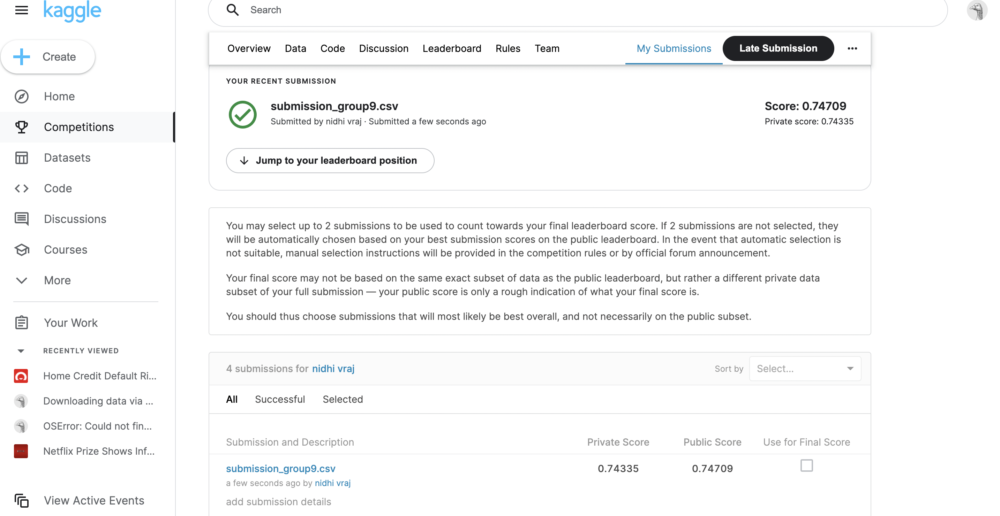

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

# Write-up (Phase -2 )
 
## Abstract
HomeCredit uses Machine Learning Modeling to provide unsecured loans based on a user's credit history, repayment patterns, and other data. Credit history is a metric that explains a user's credibility based on factors such as the user's average/minimum/maximum balance, Bureau scores recorded, salary, and repayment patterns. We use kaggle datasets to undertake exploratory data analysis, develop machine learning pipelines, and evaluate models across many evaluation metrics for a model to be deployed as part of this project. We offer feature engineering, hyperparameter tuning, and modeling pipelines in phase 2. We used a regression of baseline inputs and chosen features for Logistic, Decision Making Tree, Lasso, and Ridge Regressions. The baseline pipeline has the highest test accuracy with 92%, followed by Logistic regression with 91.98%, then Decision Making tree, and finally Lasso and Ridge being the least accurate.

## Project Description
 #### Data Description
* application_{train|test}.csv <br>
 This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET). Static data for all applications. One row represents one loan in our data sample. 
 
* POS_CASH_balance.csv <br>
This dataset gives information about previous credits information such as contract status, number of installments left to pay, DPD(days past due), etc. of the current application. Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit. <br>

* bureau.csv <br>
All client's previous credits provided by other financial institutions were reported to the Credit Bureau (for clients who have a loan in our sample). For every loan in our sample, there are as many rows as the number of credits the client had in the Credit Bureau before the application date.

* bureau_balance.csv <br>
Monthly balances of previous credits in the Credit Bureau. This table has one row for each month of history of every previous credit reported to the Credit Bureau.

* credit_card_balance.csv <br>
Monthly balance snapshots of previous credit cards that the applicant has
with Home Credit. 

* previous_application.csv <br>
All previous applications for Home Credit loans of clients who have loans in our sample. There is one row for each previous application related to loans in our data sample.

* installments_payments.csv <br>
Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample. There is a) one row for every payment that was made plus b) one row each for missed payment. One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

2. Train dataset in application.csv
- Shape: (307511, 122)
- First five rows and seven columns look like:

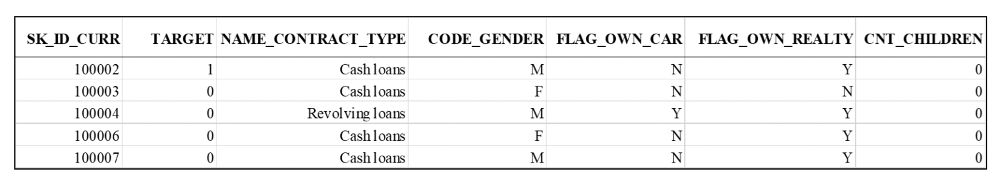


- We discarded features with null values more than 30%. We present null percentage of ten features in the below table as an example.

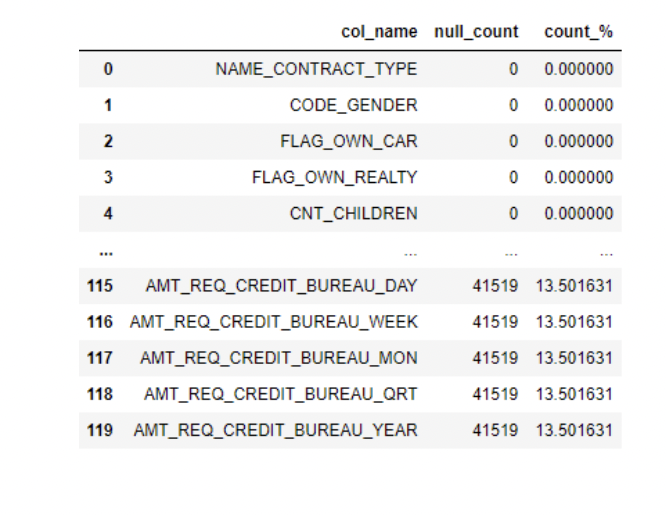

## Workflow

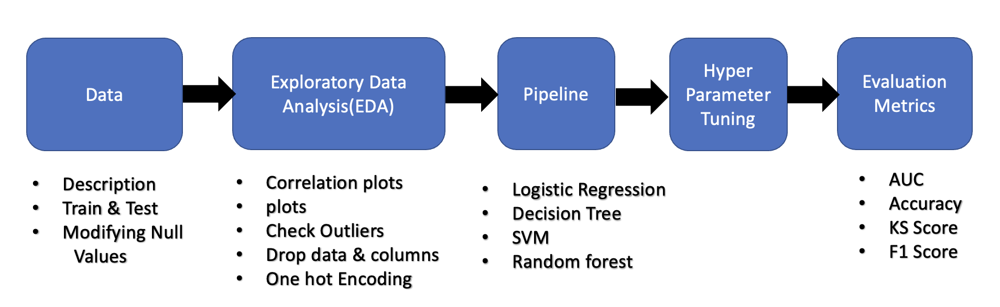



## Feature Engineering and transformers

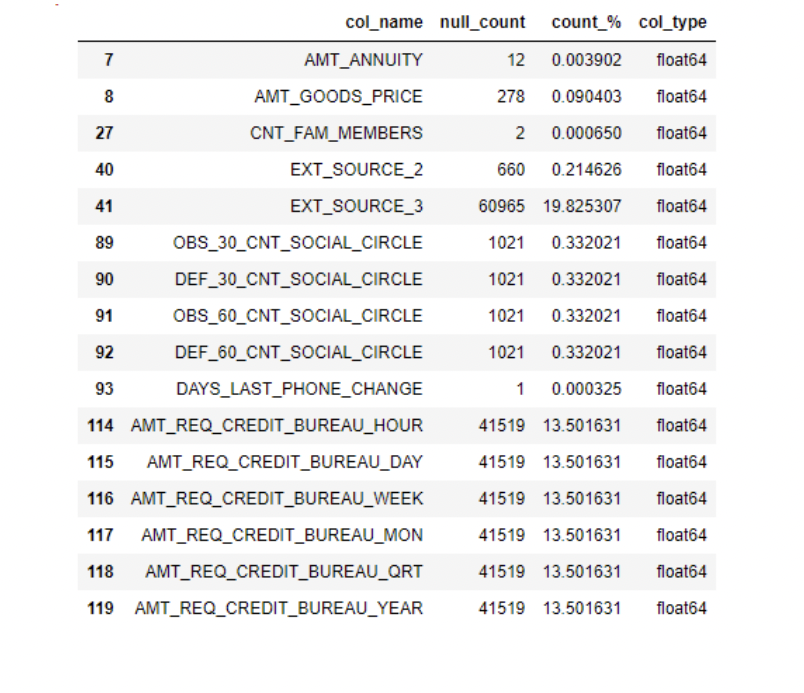

Step 1: - We discarded columns which are having more than 30% of Null Values
The above table shows the count of NA values of remaining columns and their percentages <br>

Step 2: - AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY,
AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON,
AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR gives the
number of enquiries done. As the number is not available, we can assume no enquiries are
made. So, we replace NA values with 0 <br>

Step 3: - OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE,
OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE gives us number of
immediate connections who have a loan in Home Credit. Since we don’t have data, we can
assume there are no immediate connections. So, we replace NA values with 0. <br>

Step 4: - CNT_FAM_MEMBERS NA values are filled with median <br>

Step 5: - AMT_GOODS_PRICE values are depending on NAME_FAMILY_STATUS <br>
categories. So we replaced NA values with medians w.r.t NAME_FAMILY_STATUS. We
can see in below figure that AMT_GOODS_PRICE is depends on
NAME_FAMILY_STATUS.<br>

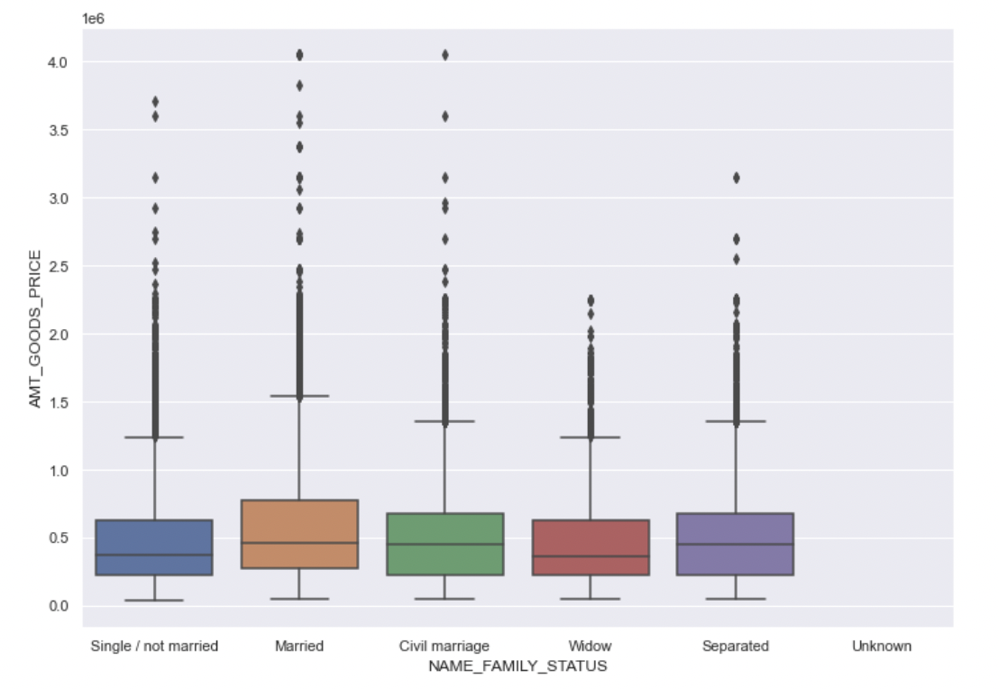

Step 6: - Dropped DAYS_LAST_PHONE_CHANGE column because there is only 1 row. <br>

Step 7: - To replace EXT_SOURCE_2 NA values, we found top 5 variables which are
highly correlated. REGION_RATING_CLIENT is highly correlated with EXT_SOURCE_2.
As REGION_RATING_CLIENT is categorical, we fill NA values with median based on
categories. <br>

Step 8: - To replace EXT_SOURCE_3 NA values, we found top 5 variables which are
highly correlated. DAYS_BIRTH is highly correlated with EXT_SOURCE_2. As
DAYS_BIRTH is numerical, we fill NA values using Linear Regression. <br>

Provide additional features added to training data <br>

- We trained and tested with selected columns. <br>
● AMT_CREDIT_TO_ANNUITY_RATIO <br>
● Tot_EXTERNAL_SOURCE <br>
● Salary_to_credit <br>
● Annuity_to_salary_ratio <br>
- Additionally we tried several other features like segregated bins based on
AMT_ANNUITY, AMT_SALARY based on percentile, but these features were not
of help for us either in increasing accuracy or AUC.
- We also tried using one-hot encoding instead of label encoding and performed modelling across Baseline and checked the results, but we found no improvement across AUC or accuracy.

#### Impact of these new features added to the model

- Then, we ran Logistic regression with these selected features and compared it with the baseline logistic regression model, as presented in the modeling session.
- The addition of these features to the training data have made an impact as presented in the below Table.

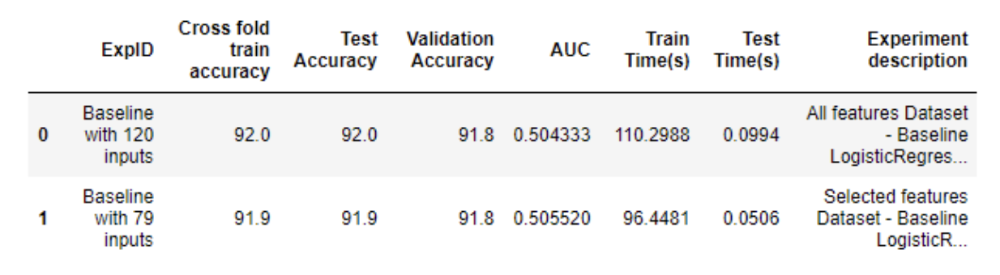

### Why we chose the method and approach
- Filling null values across categorical and continuous variables should be handled separately. It won't be feasible to fill all categorical variables with most_repeated or least repeated values and fill with either 0’s or median values across continuous variables.
- Ratios across income/credit requested/credit to be paid per year would be a good measure to judge an individual’s credibility and repayment ability so we considered adding above

## Hyperparameter tuning

- After Feature Engineering, we tuned our model to find the optimal parameters. As we
will further discuss, we will use Decision Making Tree in addition to baseline and
selected Logistic Regression.
- The hyperparameter tuning for grid search was conducted for decision Making Tree,
Lasso Regression, Ridge Regression, and Logistic Regression.

### Decision Making Tree

- For a Decision Tree model, we used different maximum depths and the number of
sample split.

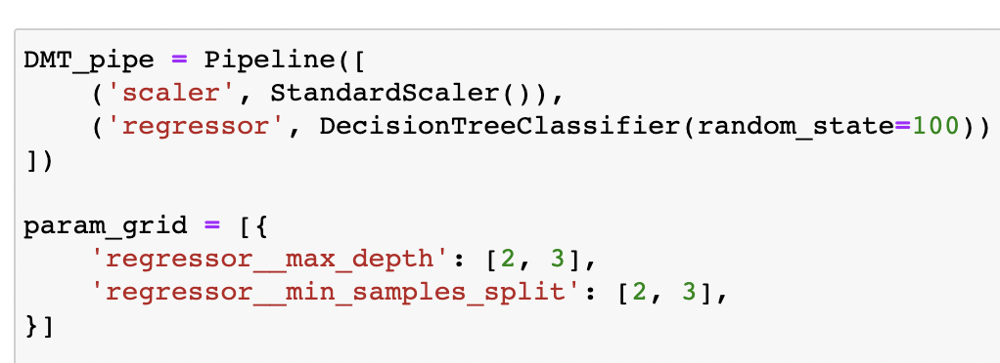


### Lasso Regression

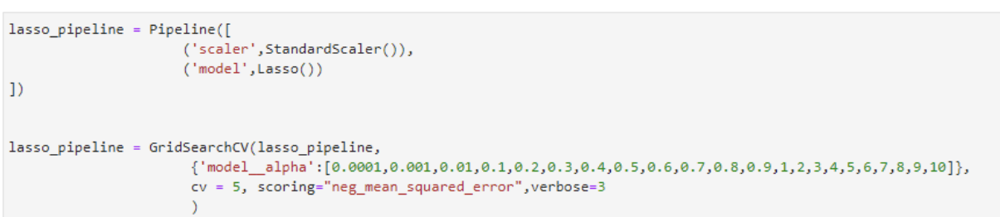

- For Lasso Regression, we used different alpha parameters and controlled the
weighting of the penalty to the loss function.

### Ridge Regression

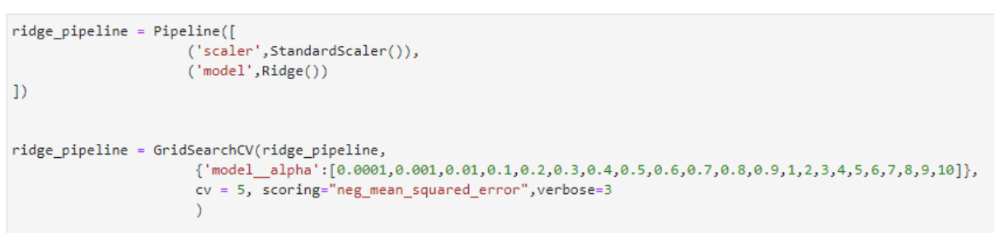

- For Ridge Regression, we used different alpha parameters and controlled the
weighting of the penalty to the loss function.

### Logistic Regression

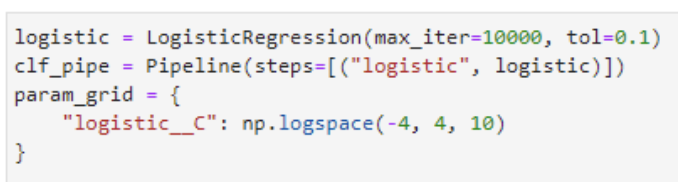

- For Logistic Regression, we used different C parameters and controlled the penalty
strength.

## Pipelines

The goal here is to predict whether the customer who has reached out to Home Credit for a loan is a defaulter or not. Therefore, this is a supervised classification task, and the output of the target variable is either 1 or 0 where 1 means non-defaulter and 0 means defaulter.

* We are planning to use the following algorithms in our machine learning pipeline.<br>
1) Logistic Regression <br>
2) Decision Trees<br>
4) Ridge Regression<br>
5) Lasso Regression<br>


### Logistic Regression

Logistic Regression can be used as a baseline model along with feature selection techniques like RFE,PCA, SelectKbest. <br> 

In statistics, the (binary) logistic model (or logit model) is a statistical model that models the probability of one event (out of two alternatives) taking place by having the log-odds (the logarithm of the odds) for the event be a linear combination of one or more independent variables ("predictors"). In regression analysis, logistic regression[1] (or logit regression) is estimating the parameters of a logistic model (the coefficients in the linear combination). Formally, in binary logistic regression there is a single binary dependent variable, coded by a indicator variable, where the two values are labeled "0" and "1", while the independent variables can each be a binary variable (two classes, coded by an indicator variable) or a continuous variable (any real value). The corresponding probability of the value labeled "1" can vary between 0 (certainly the value "0") and 1 (certainly the value "1"), hence the labeling;[2] the function that converts log-odds to probability is the logistic function, hence the name. The unit of measurement for the log-odds scale is called a logit, from logistic unit, hence the alternative names

#### loss function:

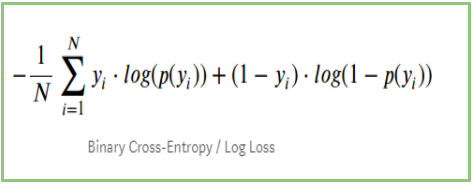

### Decision Trees:

A decision tree is a decision support tool that uses a tree-like model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility. It is one way to display an algorithm that only contains conditional control statements.

A decision tree is a flowchart-like structure in which each internal node represents a "test" on an attribute (e.g. whether a coin flip comes up heads or tails), each branch represents the outcome of the test, and each leaf node represents a class label (decision taken after computing all attributes). The paths from root to leaf represent classification rules.

In decision analysis, a decision tree and the closely related influence diagram are used as a visual and analytical decision support tool, where the expected values (or expected utility) of competing alternatives are calculated.


#### loss function:

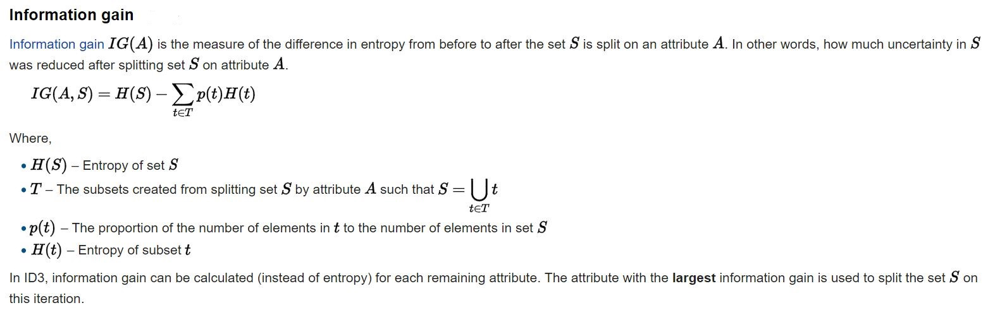



### Lasso Regression:

LASSO is a penalized regression approach that estimates the regression coefficients by maximizing the log-likelihood function (or the sum of squared residuals) with the constraint that the sum of the absolute values of the regression coefficients, ∑kj=1∣∣βj∣∣, is less than or equal to a positive constant s. One interesting property of LASSO is that the estimates of the regression coefficients are sparse, which means that many components are exactly 0. That is, LASSO automatically deletes unnecessary covariates.


#### loss function:
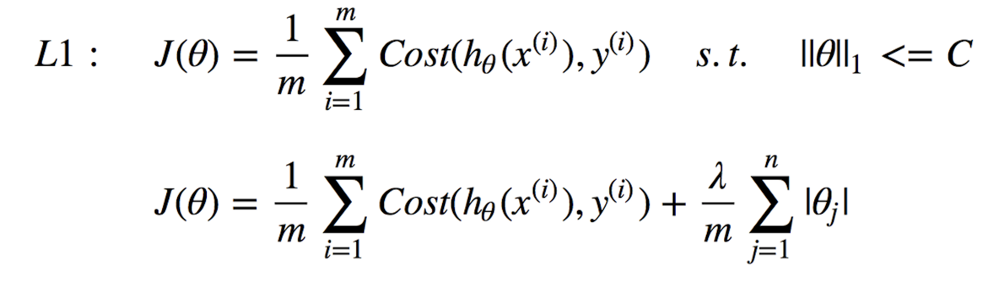

### Regularization of Logistic Regression:

#### Ridge Regression:

Ridge regression is a method of estimating the coefficients of multiple-regression models in scenarios where linearly independent variables are highly correlated.This method performs L2 regularization. When the issue of multicollinearity occurs, least-squares are unbiased, and variances are large, this results in predicted values being far away from the actual values. 
n ridge regression, the first step is to standardize the variables (both dependent and independent) by subtracting their means and dividing by their standard deviations. This causes a challenge in notation since we must somehow indicate whether the variables in a particular formula are standardized or not. As far as standardization is concerned, all ridge regression calculations are based on standardized variables. When the final regression coefficients are displayed, they are adjusted back into their original scale. However, the ridge trace is on a standardized scale.

#### loss function:

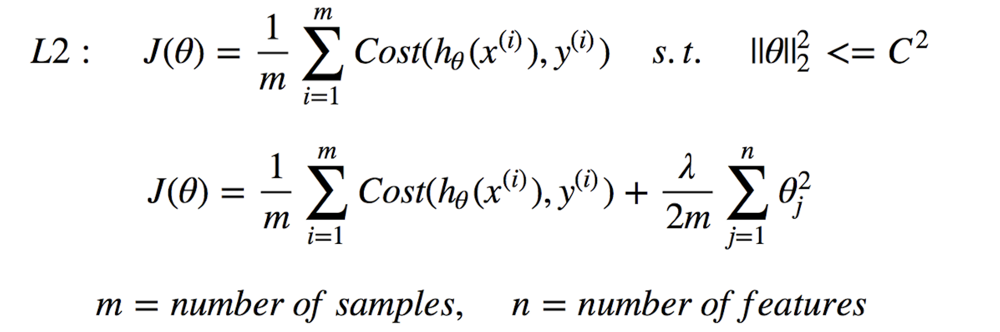


### Machine Learning Pipeline Steps:
1. Data Preprocessing <br>
a. Gather Kaggle's raw data.<br>
b. Perform exploratory data analysis on the dataset.<br>
c. Feature engineering for improving performance of machine learning model.<br>
2. Model Selection<br>
a. Develop and test various candidate models, such as "Logistic Regression","Decision Making Trees", "Random Forest", and "SVMs. <br>
b. Based on the evaluation measures, select the best model.<br>
c. Use various evaluation metrics like "accuracy," "F1 Score," and "AUC."<br>
3. Prediction Generation<br>
a. Prepare the new data and extract the features as before.<br>
b. Once the winning model has been chosen, use it to make predictions on the new data.


## Results and discussion of results


### Logistic Regression

- As we have seen the table for logistic regression, results for baseline and selected logistic regressions have been presented.
- Baseline logistic regression and selected logistic regression have similar test accuracies and AUC. They have similar cross fold train accuracy as well.
- Since baseline logistic regression already has fairly high test accuracy i.e. 92 and decent AUC 0.504, there seems no significant advantage for selecting features.

### Decision Making Tree

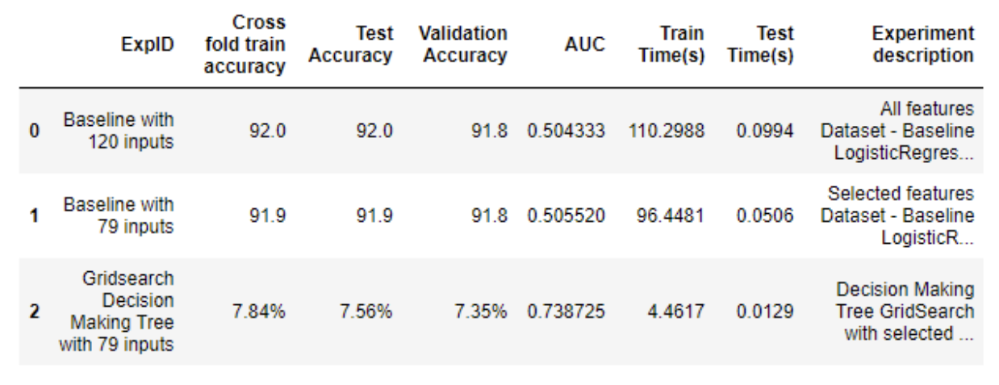

- In the above table, results for the decision tree have been presented.
- Decision tree has low test accuracy i.e. 7.56% and high AUC 0.738.
- Compared to baseline regressions, the decision tree lost test accuracy but gained AUC.
- This loss of test accuracy may be due to the short dept of the decision tree, compared to the number of variables we have used.

### Lasso Regression

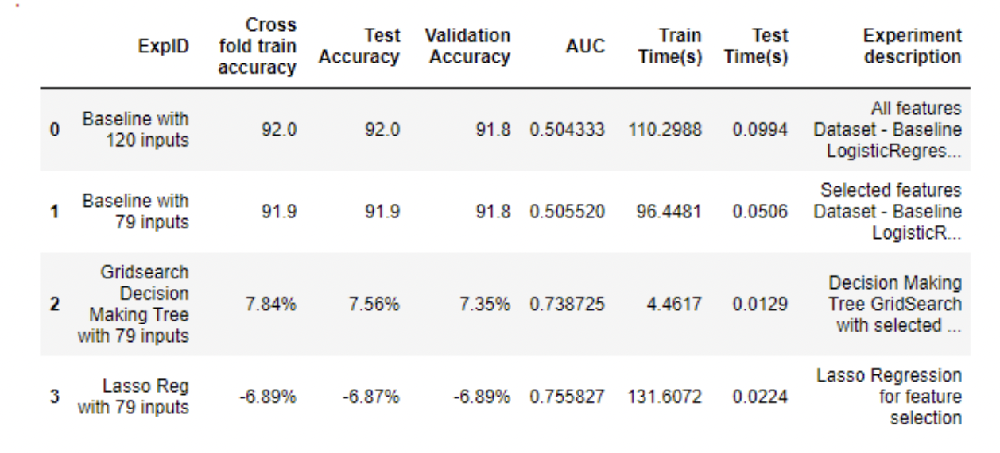

- In the above table, results for the lasso regression have been presented.
- Test accuracy has decreased to -6.89%, whereas AUC increased to 0.755.
- Although AUC has increased, since test accuracy has significantly fallen, we should not use Lasso regression.
- We believe that these negative results could be due to score functions in the lasso regression blocks.

### Ridge Regression

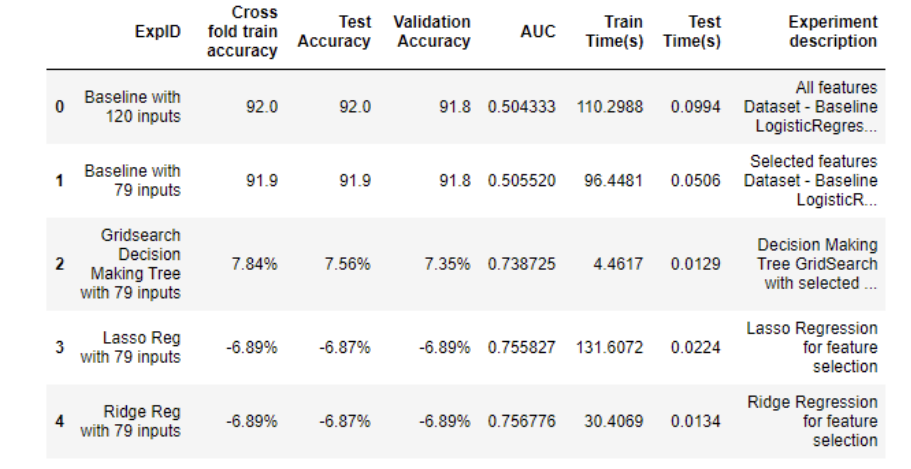

- In the above table, results for ridge regression have been presented.
- Test accuracy has decreased to -6.89%, whereas AUC increased to 0.756.
- Although AUC has increased, since test accuracy has significantly fallen, we should not use Ridge regression.
- We believe that these negative results could be due to score functions in the ridge regression blocks.

### Logistic Regression GridSearch

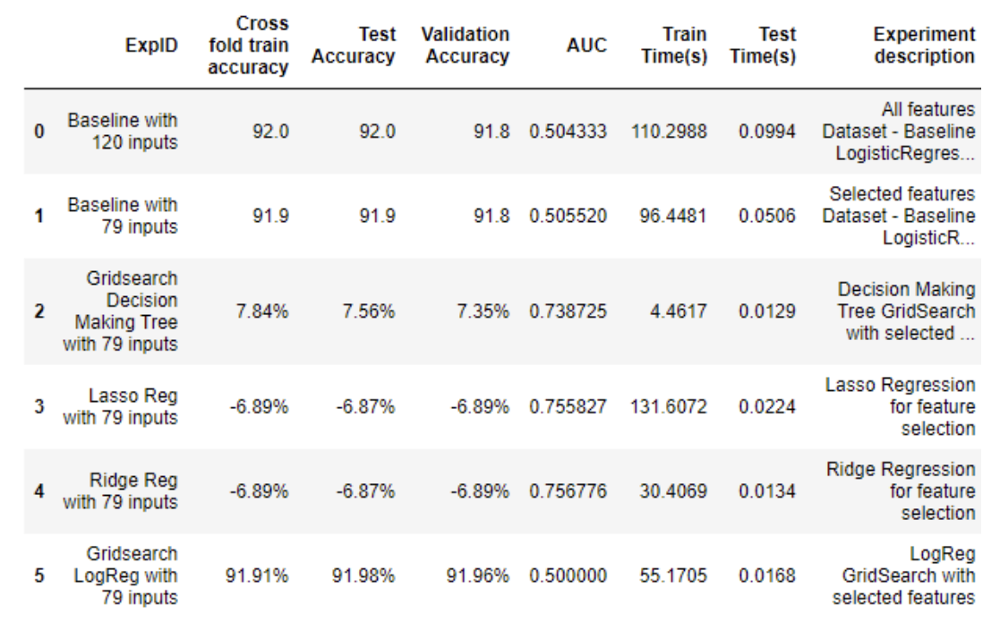

- Results for Logistic Regression GridSearch have been presented.
- Test accuracy is as high as 91.98%, but AUC is slightly lower than the baseline
regression.
- AUC for logistic regression gridsearch is 0.5, whereas that of baseline is 0.504.
- Since test accuracy and AUC are both higher for baseline regression, we should choose
baseline logistic regression instead of gridsearch logistic regression.



## Conclusion

The objective of the HCDR project is to predict the repayment ability of the
financially under-served population. This project is important because well-established
predictions are necessary to both the loaner and borrower. Real-time Homecredit is able to
display loan offers to its customers with the maximum amount and APR using their ML
pipelines where fetching data from the data providers via APIs, performing EDA and fitting
it to the model to generate scores occurs in microseconds of time. Hence Risk analysis
becomes very critical in this regard where NPA(Non-Performing Asset) expected is less than
5% in order to run a profitable business.

Credit history is a measure explaining the credibility of a user generated using
parameters like average/min/max balance maintained by the user, Bureau scores reported,
salary etc and repayment patterns could be analysed using the timely defaults/repayments
made by the user in the past. Alternate data includes other parameters like geographic data,
social media data, calling/SMS data etc. As part of this project we would be using the
datasets provided by kaggle to perform exploratory data analysis, build machine learning
pipelines and evaluate the models across several evaluation metrics for a model to be
deployed.

In phase 2, we estimated several models including both classification and regression
models. We did feature selection, data imputation, and hyperparameter tuning. First, we did
feature selection and imputation. We filled in the missing values of selected features. Then,
we decided to add relevant features based on our prior knowledge. Next, we tuned the
hyperparameters with the help of GridSearchCV. To find the best model, we trained and
evaluated several models like Logistic Regression, Decision Tree Model, Lasso Regression
and Ridge Regression. In phase 2, classification models cannot win the baseline model.
Among regression models, the ridge regression model shows the best performance.

In phase 3, we plan to implement a deep learning model and build additional models
in PyTorch. The problems that we are currently facing are that with the feature selection and
imputation step, we cannot improve the test accuracy or AUC of the baseline model. Unlike
regression models, we cannot develop a classification model better than the baseline. So, to
address these issues, in phase 3, we plan to build a multilayer model in PyTorch for loan
default classification. As a stretch goal, we will develop and implement a new multitask loss
function in Pytorch. These will be submitted to Kaggle and we will report our scores.

## Kaggle Submission



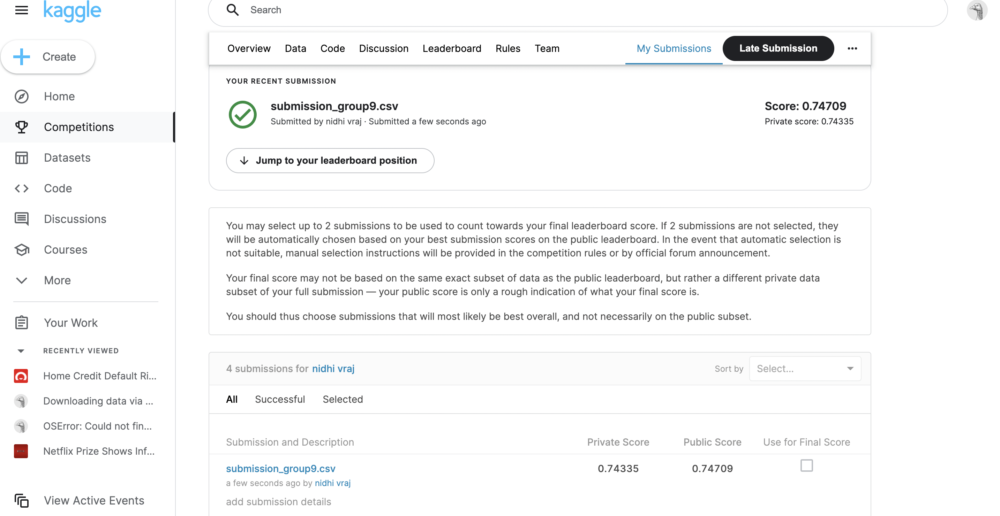

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)

https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8

https://online.stat.psu.edu/stat857/node/216/

#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/